# House Price prediction

SalePrice - the property's sale price in dollars. This is the target variable that you're trying to predict.


## 1.0 Import library

In [945]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from plotly import tools
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.linear_model import Ridge

import warnings
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
seed = 4432

### 1.1 Import dataset

In [909]:
#path = '../input/'
path = 'dataset/'
train = pd.read_csv(path+ 'train.csv')
test = pd.read_csv(path + 'test.csv')
print('Number of rows and columns in train dataset:', train.shape)
print('Number of rows and columns in test dataset:', test.shape)

Number of rows and columns in train dataset: (1460, 81)
Number of rows and columns in test dataset: (1459, 80)


### 1.2 Glimpse dataset

In [704]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [705]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [706]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### 1.3 Missing value

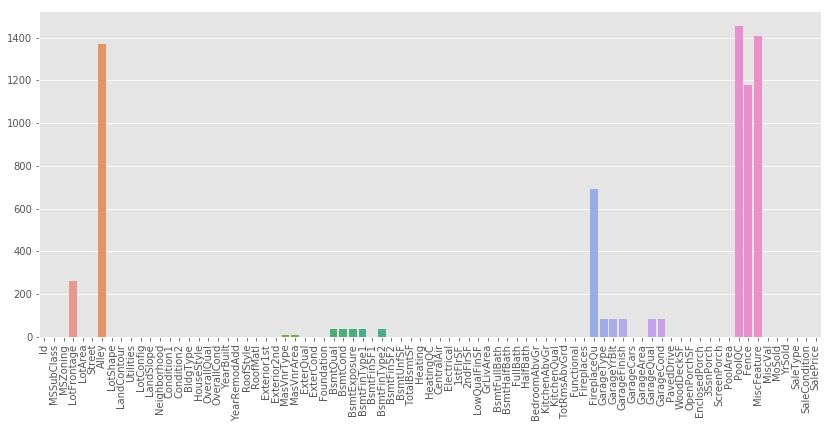

In [707]:
missing =train.isnull().sum()
plt.figure(figsize =(14,6))
sns.barplot(x = missing.index, y = missing.values)
plt.xticks(rotation=90);

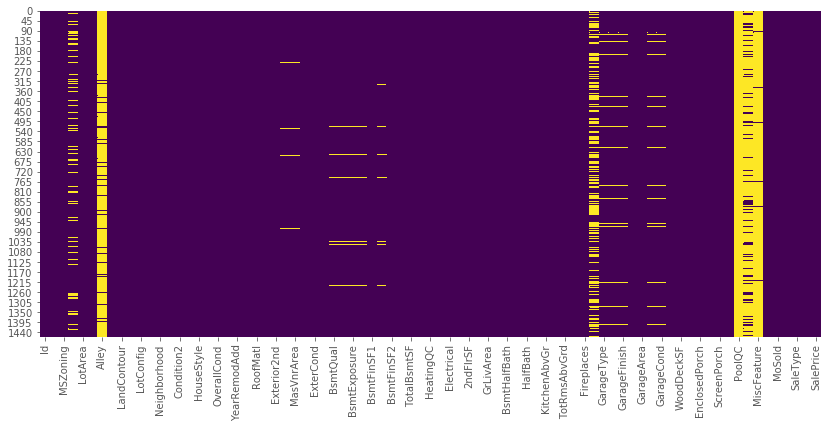

In [708]:
missing = train.isnull()
plt.figure(figsize =(14,6))
sns.heatmap(missing, cbar=False, cmap='viridis')

### 1.4 Usefull function

In [709]:
def Numeric_plot(df,column = '', title='',ncols=2,trans_func = None):
    """ Histogram plot Box plot of Numeric variable"""
    
    # Box plot
    trace1 = go.Box(y = df[column],name='Box')
    
    # Histogram
    trace2 = go.Histogram(x = df[column], name = 'x')
    
    fig = tools.make_subplots(rows=1, cols=ncols)
    fig.append_trace(trace1, 1,1)
    fig.append_trace(trace2, 1,2)
    fig['layout'].update(height=300, title=title)
    fig['layout']['yaxis1'].update(title= column)

    # Histogram after transformation
    if trans_func != None:
        tmp = df[column].apply(trans_func)
        trace3 = go.Histogram(x = tmp, name = trans_func+'(x)')
        fig.append_trace(trace3, 1,3)
    
    py.iplot(fig)


In [710]:
def Categorical_plot(df, column ='', title = '',limit=10):
    """ Barplot: of categorical variable
        Boxplot: of categoriucal and taraget variable"""
    # Barplot
    bar = df[column].value_counts()[:limit]/df.shape[0]
    bar_round = [round(w,2) for w in bar.values *100]
    trace1 = go.Bar(x = bar.index, y = bar_round, name='% Count' )    
    # Boxplot
    box = df[column].isin(bar.index[:limit])
    box =df.loc[box][[column,'SalePrice']]
    trace2 = go.Box(x = box[column], y= box['SalePrice'],name='Sale Price')

    # Figure legend
    fig = tools.make_subplots(rows=1, cols=2,)#subplot_titles= ('',''))
    fig.append_trace(trace1, 1,1)
    fig.append_trace(trace2, 1,2)
    
    fig['layout']['yaxis1'].update(title='% Count')
    fig['layout']['yaxis2'].update(title='Sale Price')
    fig['layout'].update(height=400, title=title,showlegend=False)
    py.iplot(fig)

In [711]:
def Regression_plot(df,column=''):
    """Regression plot: with pearsonr correlation value """
    cor = round(df[['SalePrice',column]].corr().iloc[0,1], 3)
    sns.jointplot(x= df[column], y = df['SalePrice'], kind= 'reg',
                  label = 'r: '+str(cor),color='blue')
    plt.legend()
    #plt.title('Regression plot ')

### 1.5 Column

In [712]:
drop_col = []
categorical_col = []
numeric_col = []

## 2 Exploratory data analysis
### 2.0 SalePrice:
The property's sale price in dollars. This is the target variable that we were trying to predict.

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



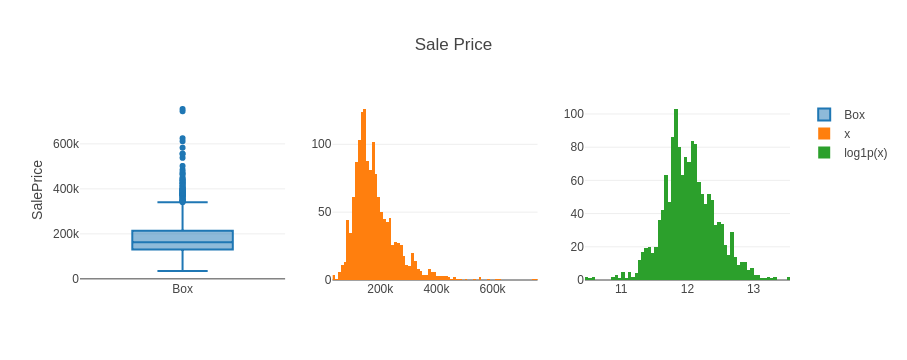

In [713]:
Numeric_plot(train, column='SalePrice',title='Sale Price',ncols=3,trans_func='log1p')

### 2.1 MSSubClass: The building class
Identifies the type of dwelling involved in the sale.
* 20 1-STORY 1946 & NEWER ALL STYLES
* 30 1-STORY 1945 & OLDER
* 40 1-STORY W/FINISHED ATTIC ALL AGES
* 45 1-1/2 STORY - UNFINISHED ALL AGES
* 50 1-1/2 STORY FINISHED ALL AGES
* 60 2-STORY 1946 & NEWER
* 70 2-STORY 1945 & OLDER
* 75 2-1/2 STORY ALL AGES
* 80 PLIT OR MULTI-LEVEL
* 85 SPLIT FOYER
* 90 DUPLEX - ALL STYLES AND AGES
* 120 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
* 150 1-1/2 STORY PUD - ALL AGES
* 160 2-STORY PUD - 1946 & NEWER
* 180 PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
* 190 2 FAMILY CONVERSION - ALL STYLES AND AGES


In [714]:
# Run this only once
map_value = {20: '1-STORY 1946 & NEWER ALL STYLES',
            30: '1-STORY 1945 & OLDER',
            40: '1-STORY W/FINISHED ATTIC ALL AGES',
            45: '1-1/2 STORY - UNFINISHED ALL AGES',
            50: '1-1/2 STORY FINISHED ALL AGES',
            60: '2-STORY 1946 & NEWER',
            70: '2-STORY 1945 & OLDER',
            75: '2-1/2 STORY ALL AGES',
            80: 'PLIT OR MULTI-LEVEL',
            85: 'SPLIT FOYER',
            90: 'DUPLEX - ALL STYLES AND AGES',
            120: '1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
            150: '1-1/2 STORY PUD - ALL AGES',
            160: '2-STORY PUD - 1946 & NEWER',
            180: 'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
            190: '2 FAMILY CONVERSION - ALL STYLES AND AGES'}

train['MSSubClass'] = train['MSSubClass'].map(map_value)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



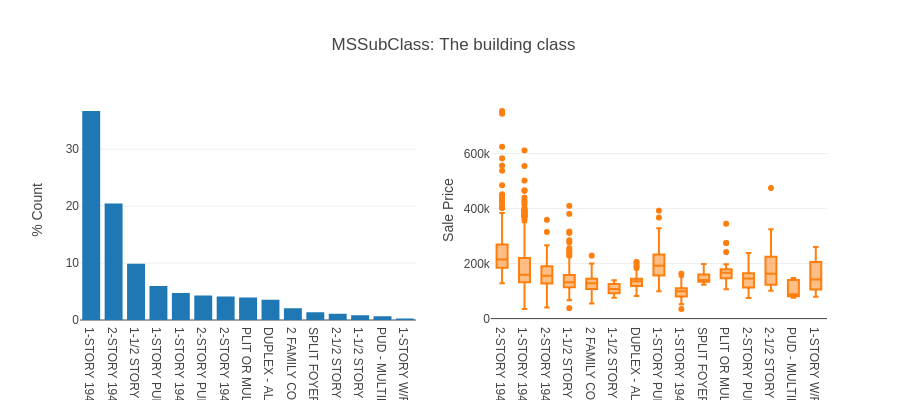

In [715]:
Categorical_plot(train, column='MSSubClass', title='MSSubClass: The building class',limit=None)

In [716]:
# Add to list of categorical column
categorical_col.append('MSSubClass')

### 2.2 MSZoning: Identifies the general zoning classification of the sale.
* A Agriculture
* C Commercial
* FV Floating Village Residential
* I Industrial
* RH Residential High Density
* RL Residential Low Density
* RP Residential Low Density Park 
* RM Residential Medium Density

In [717]:
map_value = { 
            'A': 'Agriculture',
            'C': 'Commercial',
            'FV': 'Floating Village Residential',
            'I': 'Industrial',
            'RH': 'Residential High Density',
            'RL': 'Residential Low Density',
            'RP': 'Residential Low Density Park',
            'RM': 'Residential Medium Density',
            }
train['MSZoning'] = train['MSZoning'].map(map_value)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



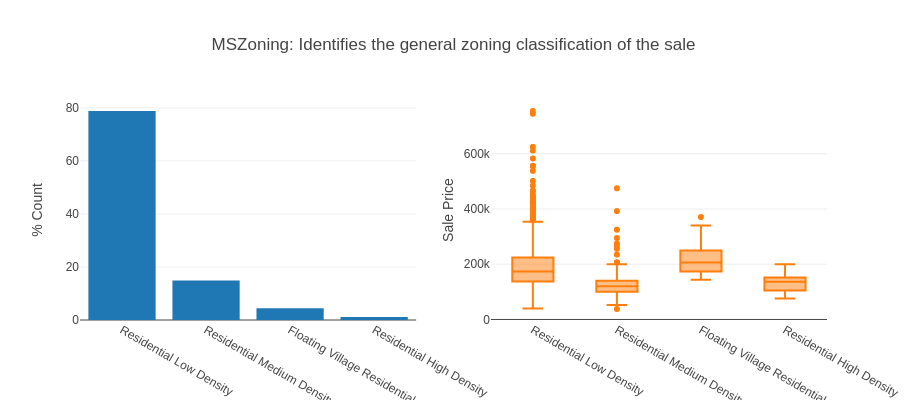

In [718]:
Categorical_plot(train, column= 'MSZoning', title ='MSZoning: Identifies the general zoning classification of the sale')

In [719]:
# Add to list of categorical column
categorical_col.append('MSZoning')

### 2.3 LotFrontage: Linear feet of street connected to property

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



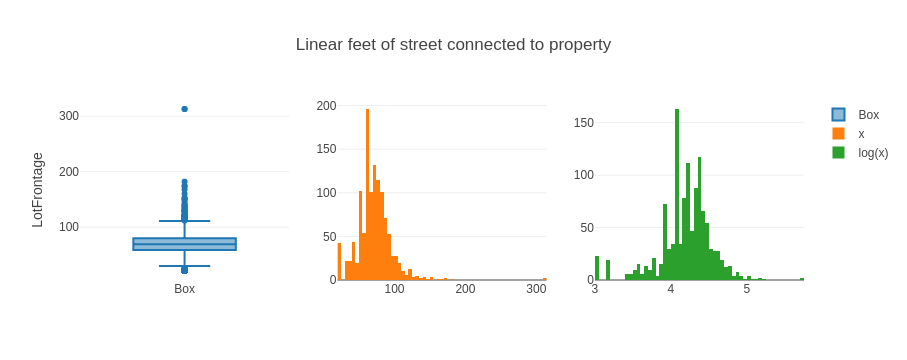

In [720]:
Numeric_plot(train, column= 'LotFrontage', ncols=3, trans_func='log', title='Linear feet of street connected to property')

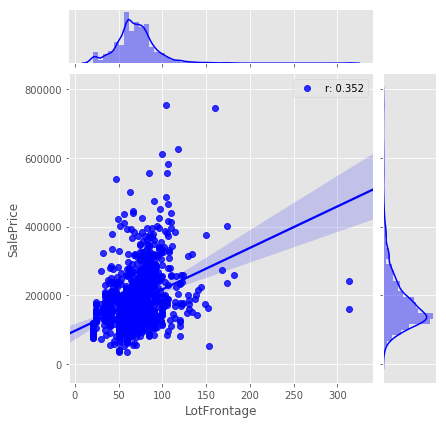

In [721]:
Regression_plot(train, column='LotFrontage')

In [722]:
# Add to list of Numeric column list
numeric_col.append('LotFrontage')

### 2.4 LotArea: Lot size in square feet

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]  [ (1,3) x3,y3 ]



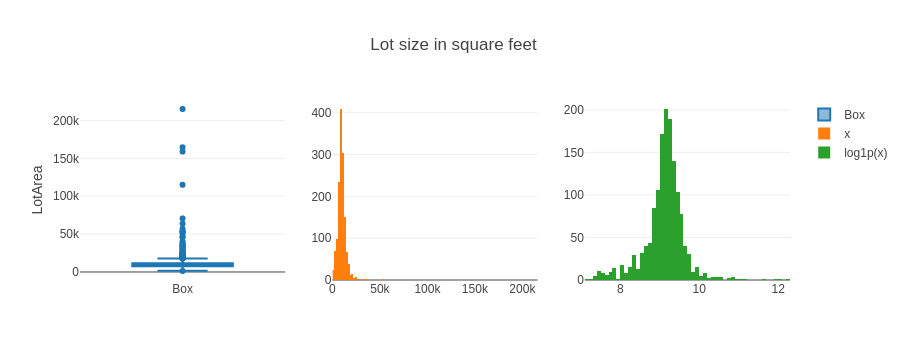

In [723]:
Numeric_plot(train, column = 'LotArea',ncols=3, trans_func='log1p', title='Lot size in square feet')

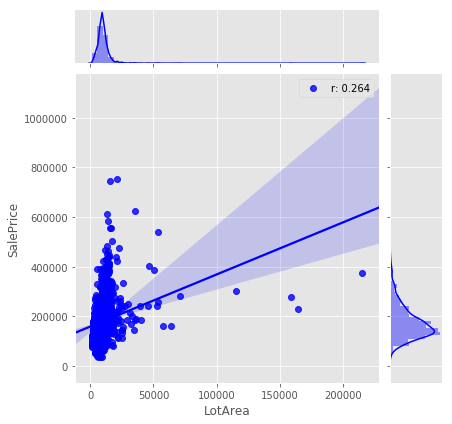

In [724]:
Regression_plot(train, column='LotArea')

In [725]:
# Add to list of Numeric column list
numeric_col.append('LotArea')

### 2.5 Street: Type of road access to property
* Grvl: Gravel
* Pave: Paved

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



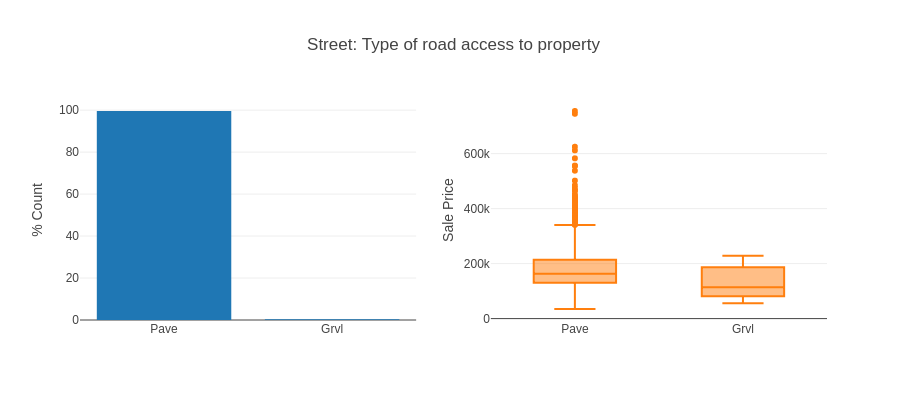

In [726]:
Categorical_plot(train, column='Street', title= 'Street: Type of road access to property')

In [727]:
# Add to list of Drop column list
drop_col.append('Street')

### 2.6 Alley: Type of alley access to property
* Grvl: Gravel
* Pave: Paved
* NA: No alley access

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



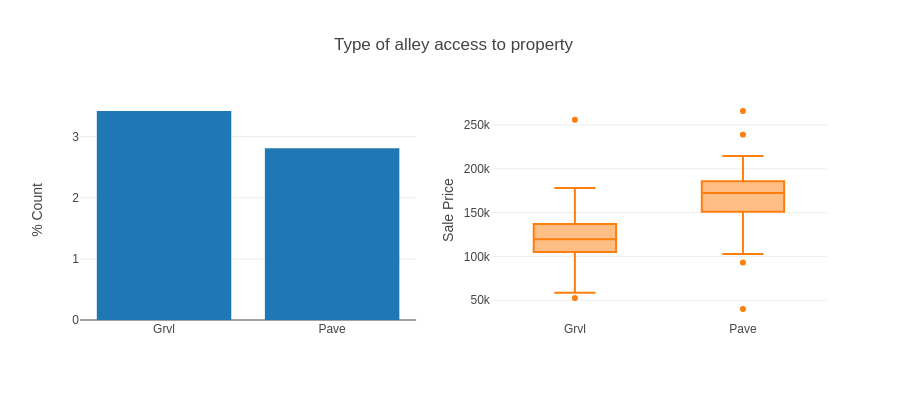

In [728]:
Categorical_plot(train, column='Alley', title= 'Type of alley access to property')

In [729]:
# Add to list of categorical column list
drop_col.append('Alley')

### 2.7 LotShape: General shape of property
* Reg: Regular
* IR1: Slightly irregular
* IR2: Moderately Irregular
* IR3: Irregular

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



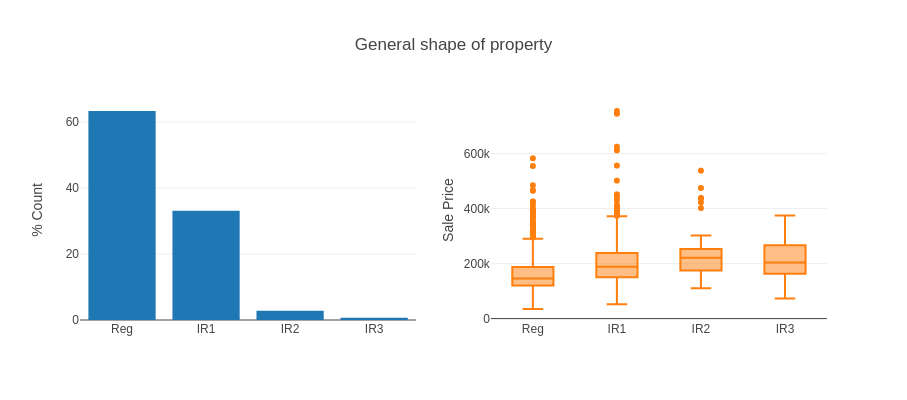

In [730]:
Categorical_plot(train, column='LotShape', title= 'General shape of property')

In [731]:
# Add to list of categorical column list
categorical_col.append('LotShape')

### 2.8 LandContour: Flatness of the property
* Lvl: Near Flat/Level
* Bnk: Banked - Quick and significant rise from street grade to building
* HLS: Hillside - Significant slope from side to side
* Low: Depression

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



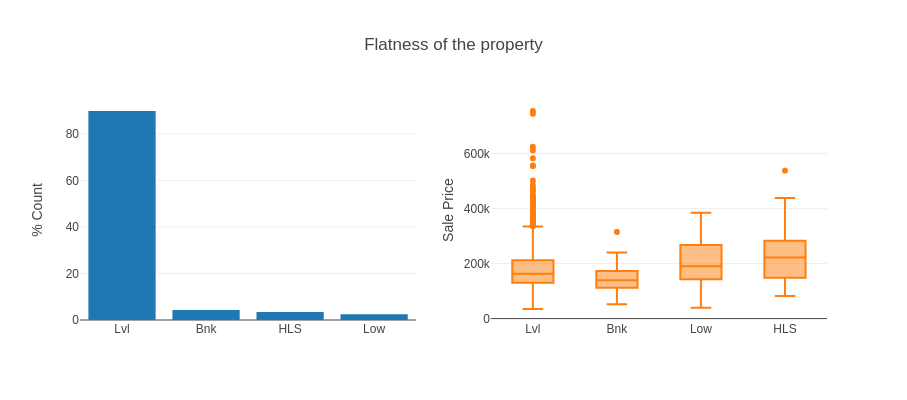

In [732]:
Categorical_plot(train, column='LandContour', title= 'Flatness of the property')

In [733]:
# Add to list of categorical column list
categorical_col.append('LandContour')

### 2.9 Utilities: Type of utilities available

       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



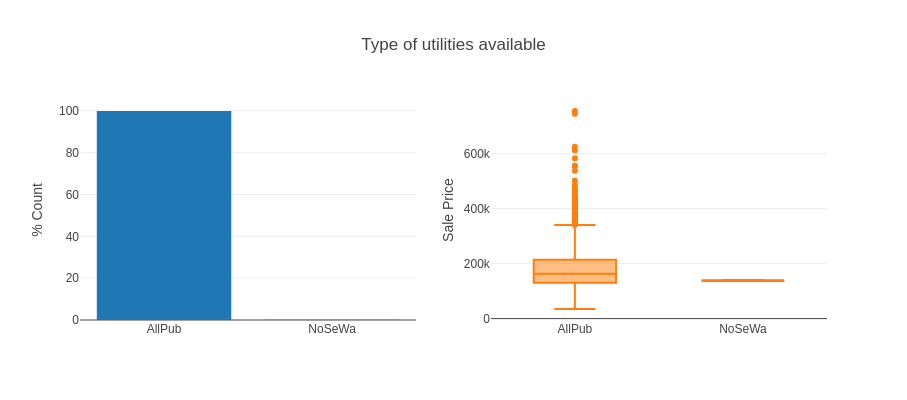

In [734]:
Categorical_plot(train, column='Utilities', title= 'Type of utilities available')

In [735]:
# Add to list of Drop column list
drop_col.append('Utilities')

### 2.10 LotConfig: Lot configuration
       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



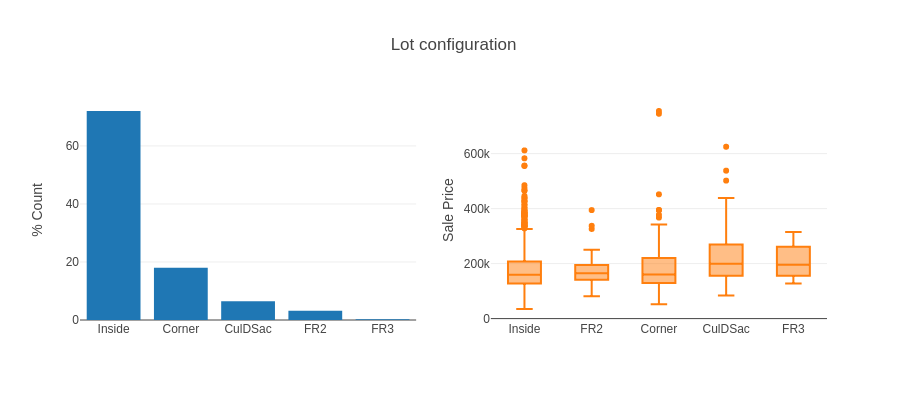

In [736]:
Categorical_plot(train, column='LotConfig', title= 'Lot configuration')

In [737]:
# Add to list of categorical column list
categorical_col.append('LotConfig')

### 2.11 LandSlope: Slope of property
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



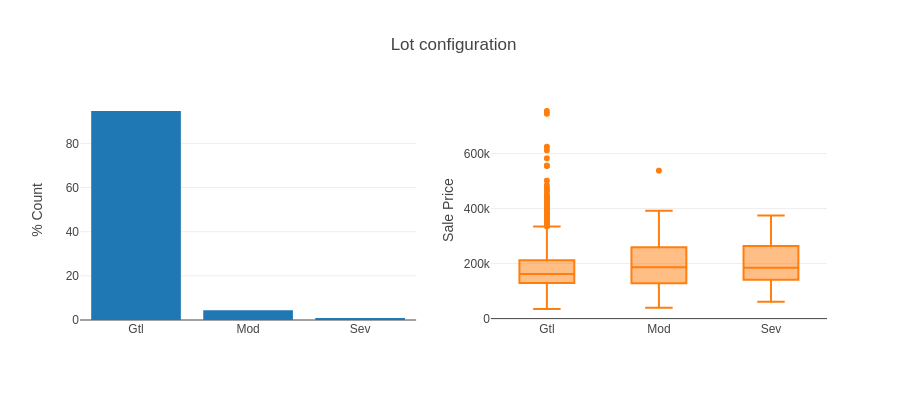

In [738]:
Categorical_plot(train, column='LandSlope', title= 'Lot configuration')

In [739]:
# Add to list of categorical column list
categorical_col.append('LandSlope')

### 2.12 Neighborhood: Physical locations within Ames city limits
       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



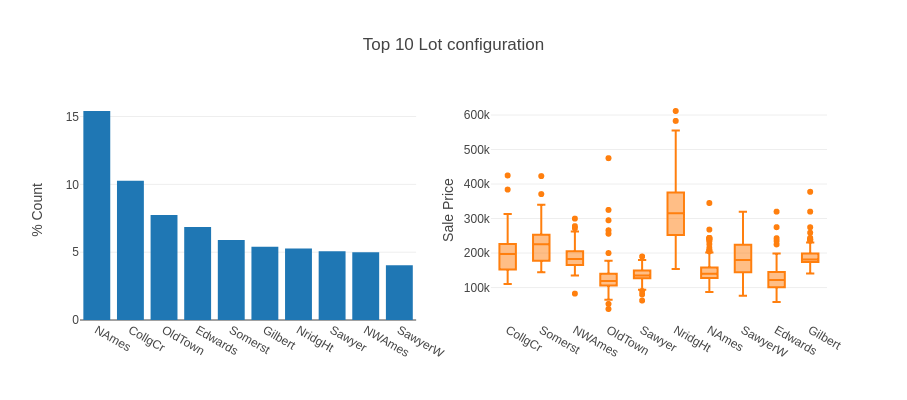

In [740]:
Categorical_plot(train, column='Neighborhood', title= 'Top 10 Lot configuration',limit=10)

In [741]:
# Add to list of categorical column list
categorical_col.append('Neighborhood')

### 2.13 Condition1: Proximity to various conditions
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



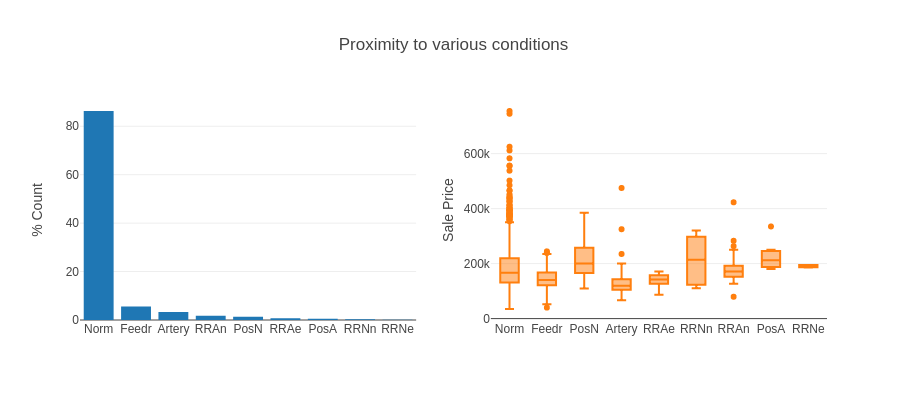

In [742]:
Categorical_plot(train, column='Condition1', title= 'Proximity to various conditions',limit=None)

In [743]:
# Add to list of categorical column list
categorical_col.append('Condition1')

### 2.14 Condition2: Proximity to various conditions (if more than one is present)
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



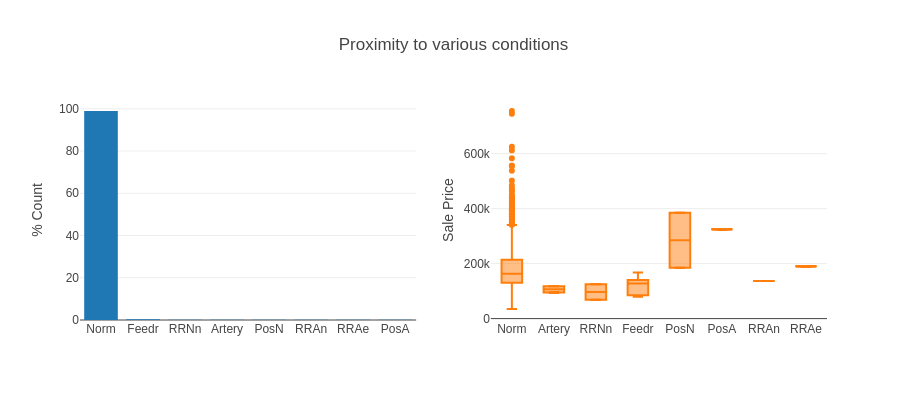

In [744]:
Categorical_plot(train, column='Condition2', title= 'Proximity to various conditions',limit=None)

In [745]:
# Add to list of categorical column list
categorical_col.append('Condition2')

### 2.15 BldgType: Type of dwelling
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



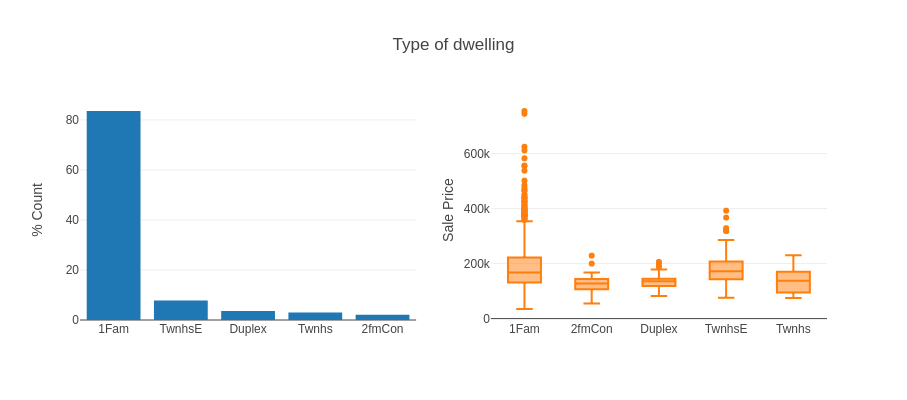

In [746]:
Categorical_plot(train, column='BldgType', title= 'Type of dwelling',limit=None)

In [747]:
# Add to list of categorical column list
categorical_col.append('BldgType')

### 2.16 HouseStyle: Style of dwelling
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



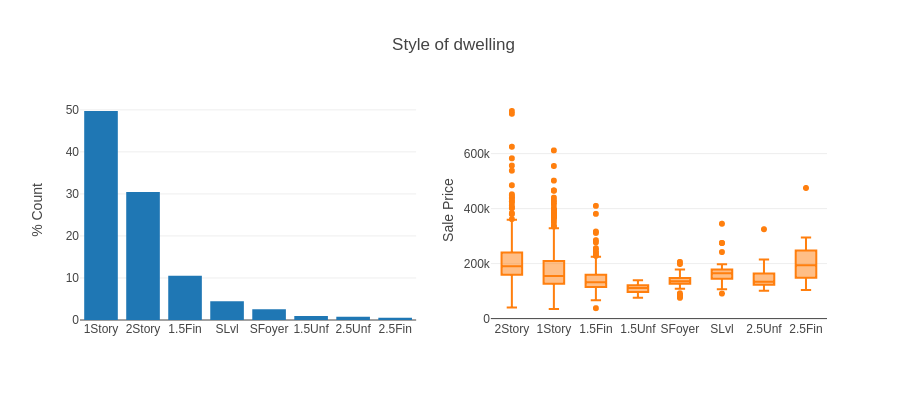

In [748]:
Categorical_plot(train, column='HouseStyle', title= 'Style of dwelling',limit=None)

In [749]:
# Add to list of categorical column list
categorical_col.append('HouseStyle')

### 2.17 OverallQual: Rates the overall material and finish of the house
10: Very Excellent
9: Excellent
8: Very Good
7: Good
6: Above Average
5: Average
4: Below Average
3: Fair
2: Poor
1: Very Poor

In [750]:
map_values = {10: 'Very Excellent', 
             9: 'Excellent', 
             8: 'Very Good',
             7: 'Good',
             6: 'Above Average',
             5: 'Average',
             4: 'Below Average',
             3: 'Fair',
             2: 'Poor',
             1: 'Very Poor'
            }
train['OverallQual'] = train['OverallQual'].map(map_values)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



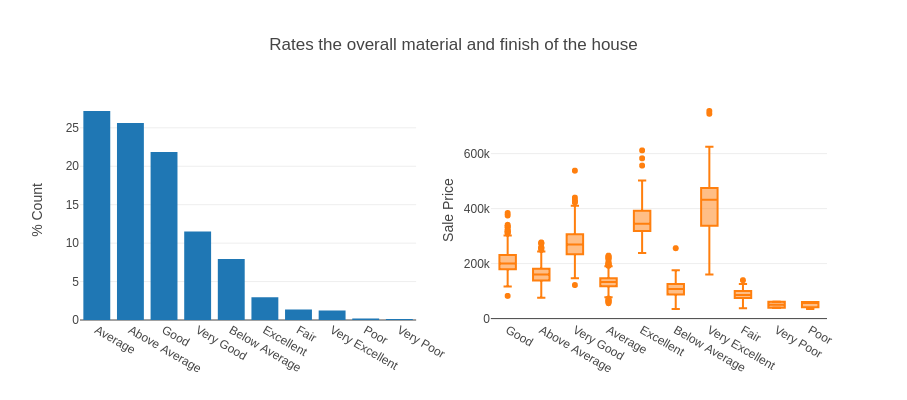

In [751]:
Categorical_plot(train, column='OverallQual', title= 'Rates the overall material and finish of the house',limit=None)

In [752]:
# Add to list of categorical column list
categorical_col.append('OverallQual')

### 2.18 OverallCond: Rates the overall condition of the house
10: Very Excellent
9: Excellent
8: Very Good
7: Good
6: Above Average
5: Average
4: Below Average
3: Fair
2: Poor
1: Very Poor

In [753]:
map_values = {10: 'Very Excellent', 
             9: 'Excellent', 
             8: 'Very Good',
             7: 'Good',
             6: 'Above Average',
             5: 'Average',
             4: 'Below Average',
             3: 'Fair',
             2: 'Poor',
             1: 'Very Poor'
            }
train['OverallCond'] = train['OverallCond'].map(map_values)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



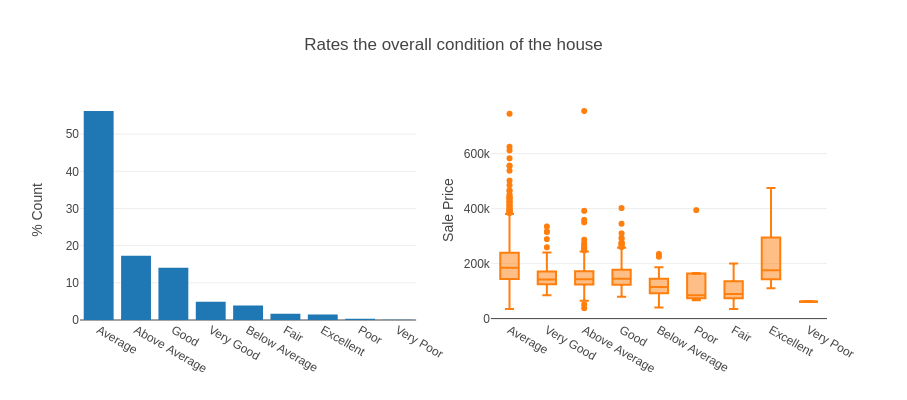

In [754]:
Categorical_plot(train, column='OverallCond', title= 'Rates the overall condition of the house',limit=None)

In [755]:
# Add to list of categorical column list
categorical_col.append('OverallCond')

### 2.19 YearBuilt: Original construction date

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



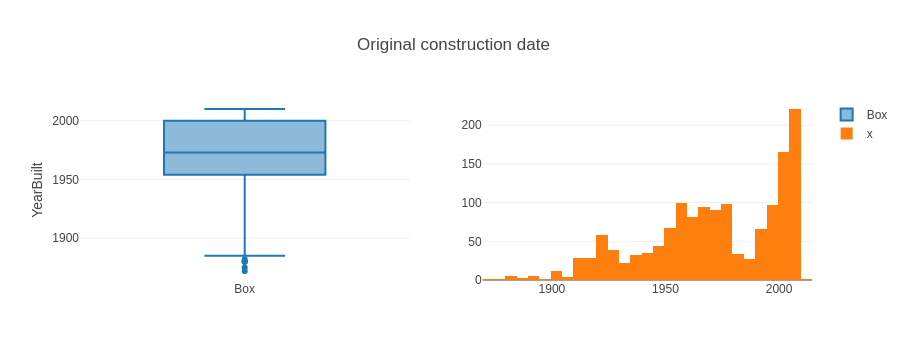

In [756]:
Numeric_plot(train, column='YearBuilt', title= 'Original construction date', ncols=2,)# trans_func='sqrt')

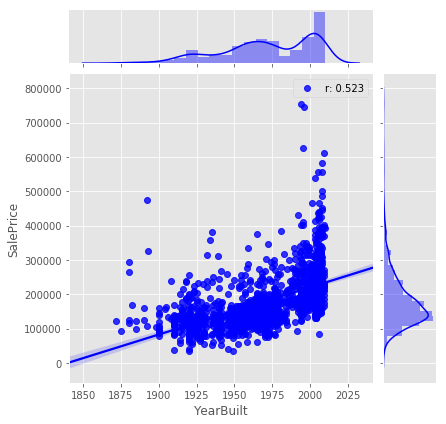

In [757]:
Regression_plot(train, column='YearBuilt')

In [758]:
# Add to numeric column list
numeric_col.append('YearBuilt')

### 2.20 YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



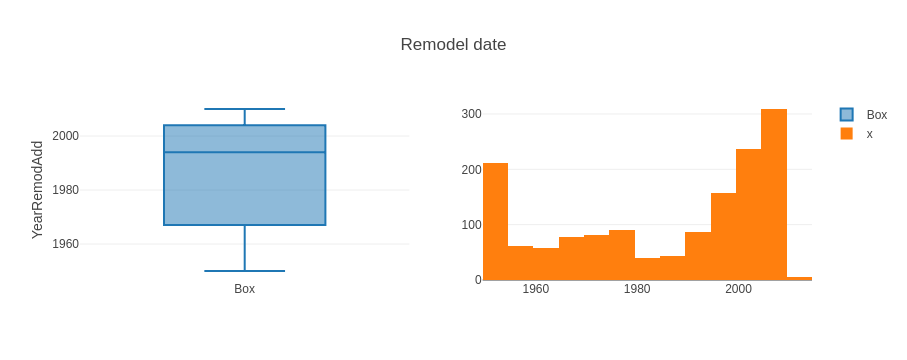

In [759]:
Numeric_plot(train, column='YearRemodAdd', title= 'Remodel date', ncols=2,)# trans_func='log')

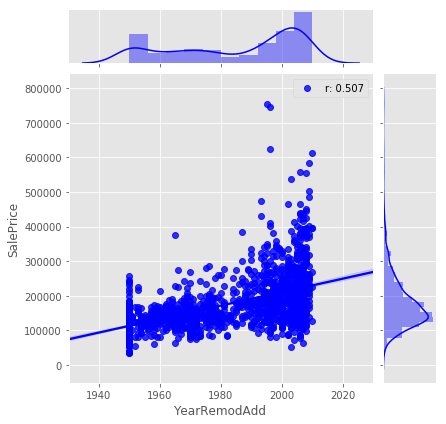

In [760]:
Regression_plot(train, column='YearRemodAdd')

In [761]:
# Add to numeric column list
numeric_col.append('YearRemodAdd')

### 2.21 RoofStyle: Type of roof

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



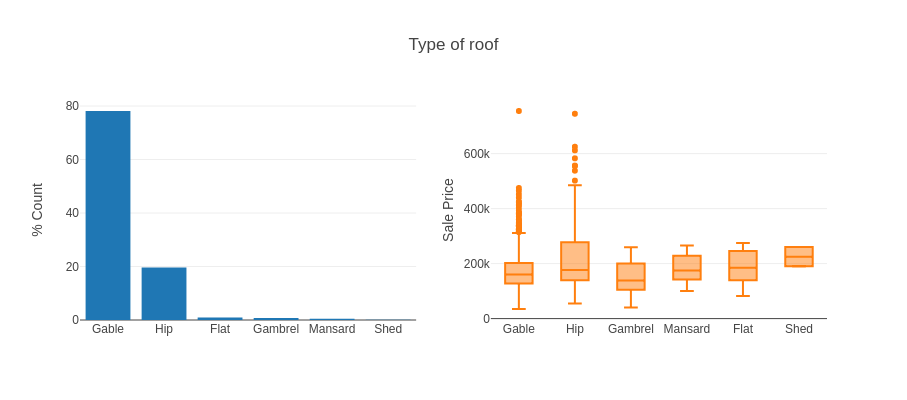

In [762]:
Categorical_plot(train, column='RoofStyle', title= 'Type of roof',limit=None)

In [763]:
# Add to list of categorical column list
categorical_col.append('RoofStyle')

### 2.22 RoofMatl: Roof material
    ClyTile	Clay or Tile
    CompShg	Standard (Composite) Shingle
    Membran	Membrane
    Metal	Metal
    Roll	Roll
    Tar&Grv	Gravel & Tar
    WdShake	Wood Shakes
    WdShngl	Wood Shingles

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



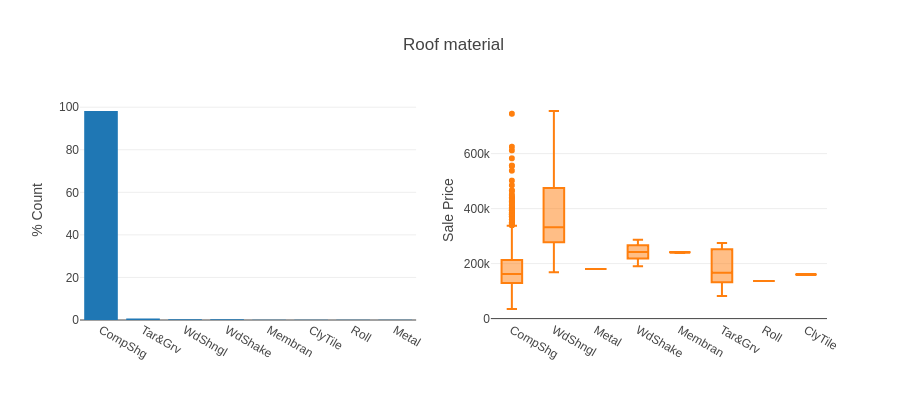

In [764]:
Categorical_plot(train, column='RoofMatl', title= 'Roof material',limit=None)

In [765]:
# Add to list of drop column list
drop_col.append('RoofMatl')

### 2.23 Exterior1st: Exterior covering on house
       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



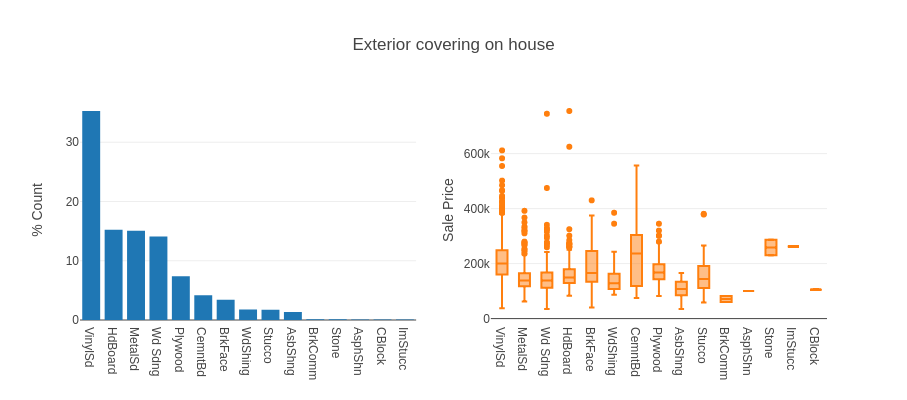

In [766]:
Categorical_plot(train, column='Exterior1st', title= 'Exterior covering on house',limit=None)

In [767]:
# Add to list of categorical column list
categorical_col.append('Exterior1st')

### 2.24 Exterior2nd: Exterior covering on house (if more than one material)
       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



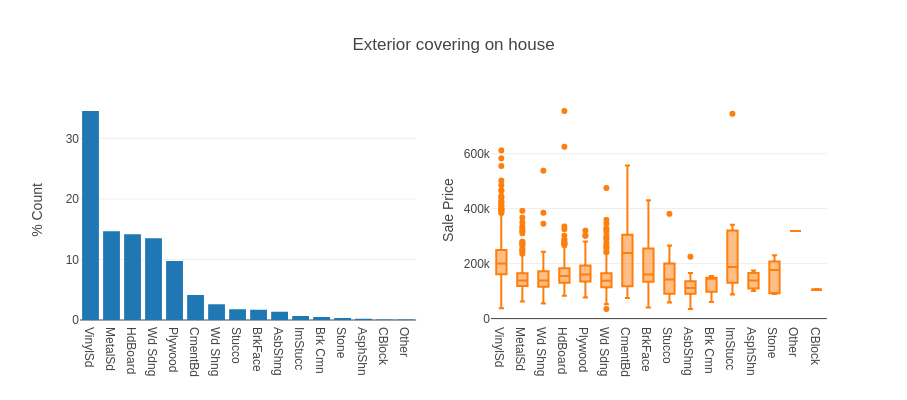

In [768]:
Categorical_plot(train, column='Exterior2nd', title= 'Exterior covering on house',limit=None)

In [769]:
# Add to list of categorical column list
categorical_col.append('Exterior2nd')

### 2.25 MasVnrType: Masonry veneer type
       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



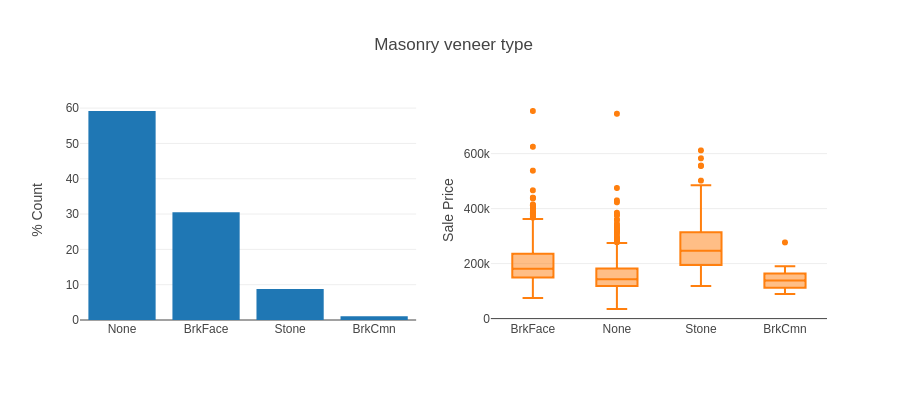

In [770]:
Categorical_plot(train, column='MasVnrType', title= 'Masonry veneer type',limit=None)

In [771]:
# Add to list of categorical column list
categorical_col.append('MasVnrType')

### 2.26 MasVnrArea: Masonry veneer area in square feet

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



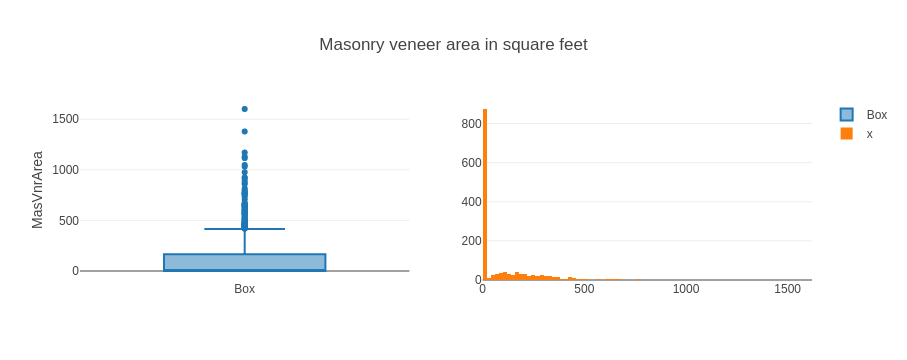

In [772]:
Numeric_plot(train, column= 'MasVnrArea', title= 'Masonry veneer area in square feet',) #ncols=3, trans_func='sqrt')

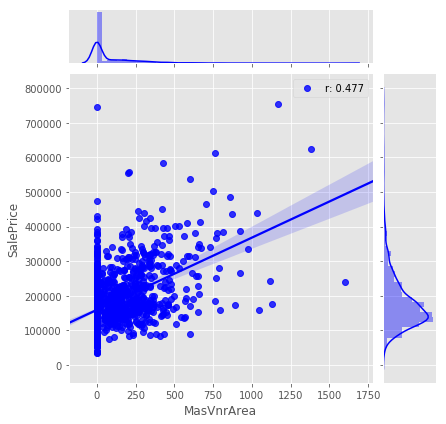

In [773]:
Regression_plot(train, column='MasVnrArea')

In [774]:
# Add to list of numeric column list
numeric_col.append('MasVnrArea')

### 2.27 ExterQual: Evaluates the quality of the material on the exterior 
* Ex: Excellent
* Gd: Good
* TA: Average/Typical
* Fa: Fair
* Po: Poor

In [775]:
map_values = { 
            'Ex': 'Excellent',
            'Gd': 'Good',
            'TA': 'Average/Typical',
            'Fa': 'Fair',
            'Po': 'Poor'
            }
train['ExterQual'] = train['ExterQual'].map(map_values)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



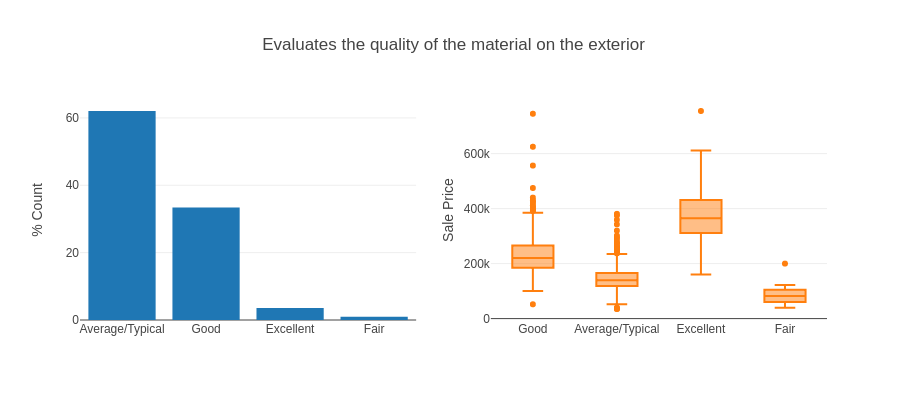

In [776]:
Categorical_plot(train, column='ExterQual', title= 'Evaluates the quality of the material on the exterior',limit=None)

In [777]:
# Add to list of categorical column list
categorical_col.append('ExterQual')

### 2.30 ExterCond: Evaluates the present condition of the material on the exterior
* Ex: Excellent
* Gd: Good
* TA: Average/Typical
* Fa: Fair
* Po: Poor

In [778]:
map_values = { 
            'Ex': 'Excellent',
            'Gd': 'Good',
            'TA': 'Average/Typical',
            'Fa': 'Fair',
            'Po': 'Poor'
            }
train['ExterCond'] = train['ExterCond'].map(map_values)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



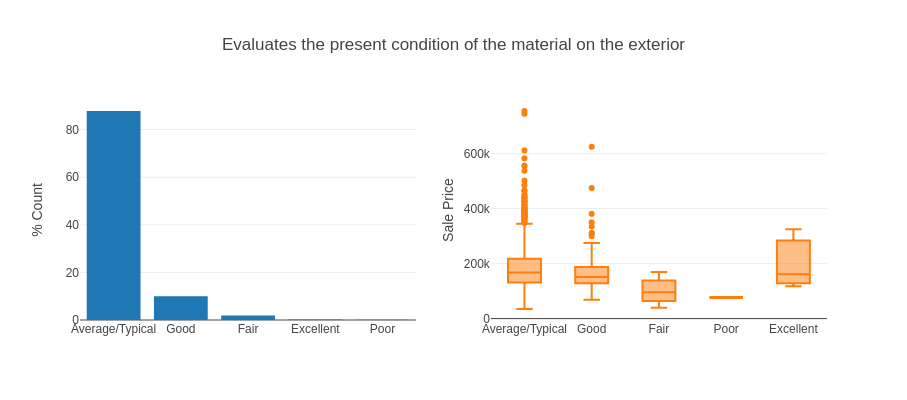

In [779]:
Categorical_plot(train, column='ExterCond', title= 'Evaluates the present condition of the material on the exterior',limit=None)

In [780]:
# Add to list of categorical column list
categorical_col.append('ExterCond')

### 2.31 Foundation: Type of foundation
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



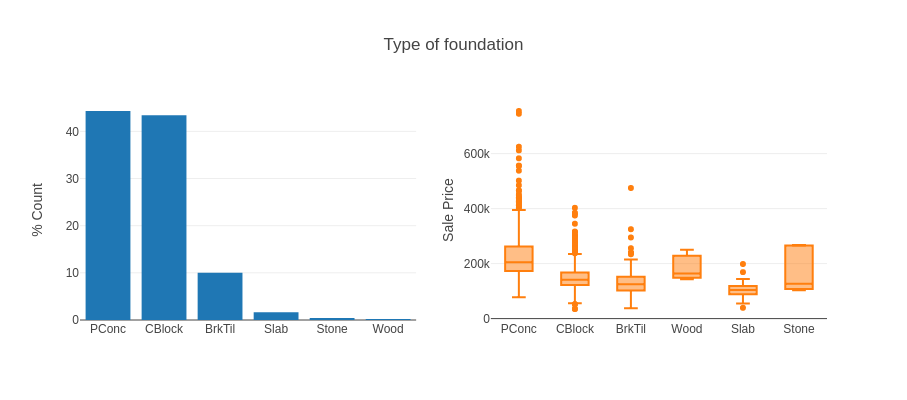

In [781]:
Categorical_plot(train, column='Foundation', title= 'Type of foundation',limit=None)

In [782]:
# Add to list of categorical column list
categorical_col.append('Foundation')

### 2.32 BsmtQual: Evaluates the height of the basement
* Ex: Excellent (100+ inches)	
* Gd: Good (90-99 inches)
* TA: Typical (80-89 inches)
* Fa: Fair (70-79 inches)
* Po: Poor (<70 inches
* NA: No Basement

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



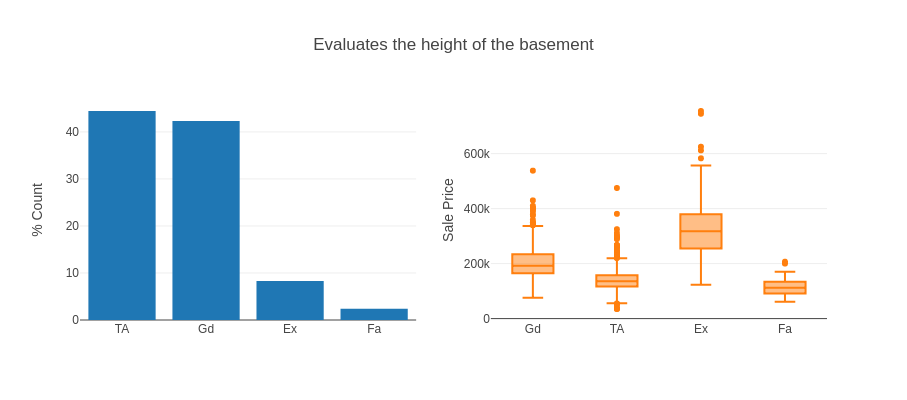

In [783]:
Categorical_plot(train, column='BsmtQual', title= 'Evaluates the height of the basement',limit=None)

In [784]:
# Add to list of categorical column list
categorical_col.append('BsmtQual')

### 2.33 BsmtCond: Evaluates the general condition of the basement
       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



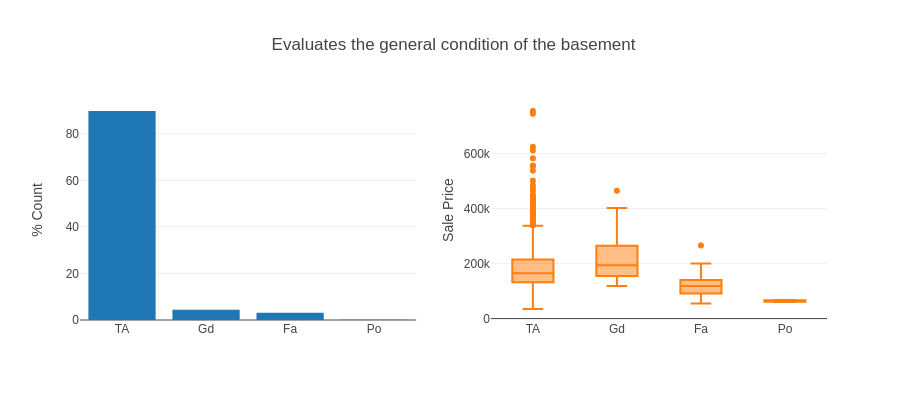

In [785]:
Categorical_plot(train, column='BsmtCond', title= 'Evaluates the general condition of the basement',limit=None)

In [786]:
# Add to list of categorical column list
categorical_col.append('BsmtCond')

### 2.34 BsmtExposure: Refers to walkout or garden level walls
       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



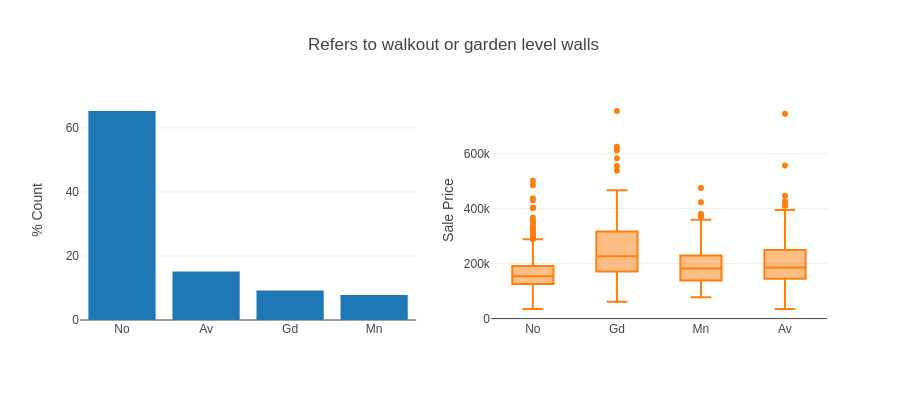

In [787]:
Categorical_plot(train, column='BsmtExposure', title= 'Refers to walkout or garden level walls',limit=None)

In [788]:
# Add to list of categorical column list
categorical_col.append('BsmtExposure')

### 2.35 BsmtFinType1: Rating of basement finished area
       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



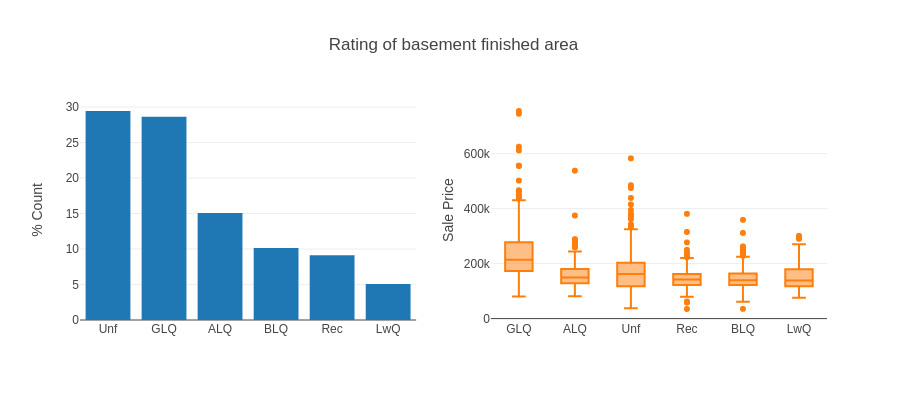

In [789]:
Categorical_plot(train, column='BsmtFinType1', title= 'Rating of basement finished area',limit=None)

In [790]:
# Add to list of categorical column list
categorical_col.append('BsmtFinType1')

### 2.36 BsmtFinSF1: Type 1 finished square feet

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



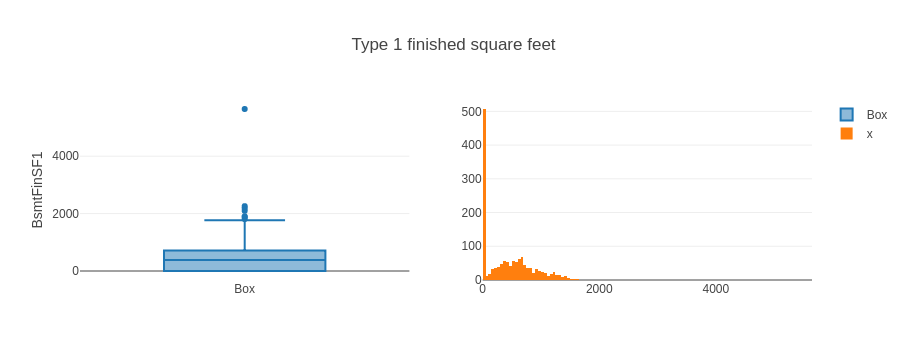

In [791]:
Numeric_plot(train, column='BsmtFinSF1', title='Type 1 finished square feet')#,ncols=3, trans_func='log1p')

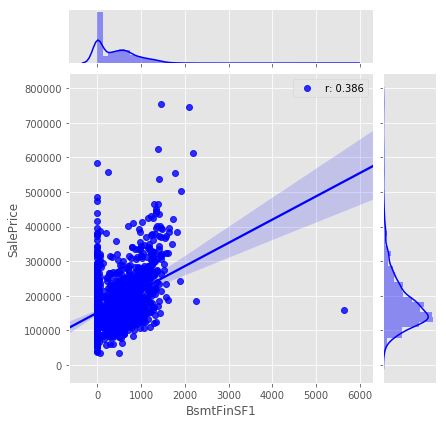

In [792]:
Regression_plot(train, column= 'BsmtFinSF1')

In [793]:
# Add to list of numeric column list
numeric_col.append('BsmtFinSF1')

### 2.37 BsmtFinType2: Rating of basement finished area (if multiple types)
       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



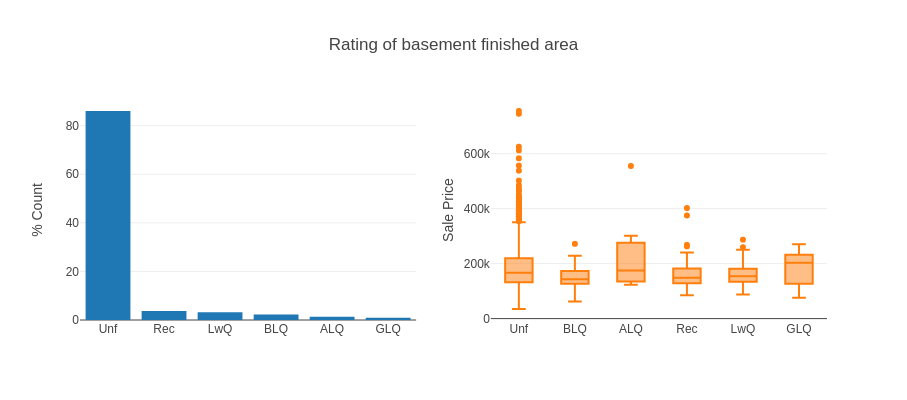

In [794]:
Categorical_plot(train, column='BsmtFinType2', title= 'Rating of basement finished area',limit=None)

In [795]:
# Add to list of categorical column list
categorical_col.append('BsmtFinType2')

### 2.38 BsmtFinSF2: Type 2 finished square feet

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



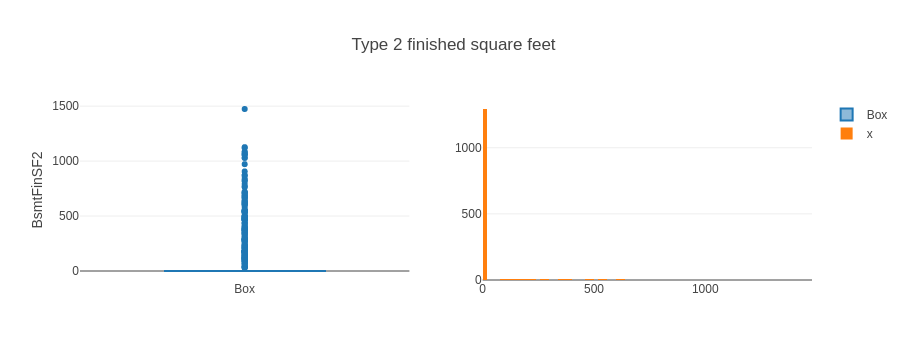

In [796]:
Numeric_plot(train, column='BsmtFinSF2', title='Type 2 finished square feet')#,ncols=3, trans_func='log1p')

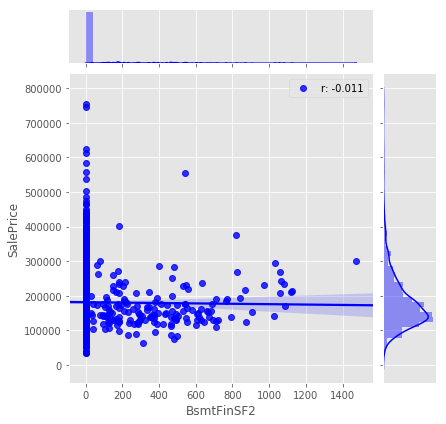

In [797]:
Regression_plot(train, column= 'BsmtFinSF2')

In [798]:
# Add to list of numeric column list
numeric_col.append('BsmtFinSF2')

### 2.39 BsmtUnfSF: Unfinished square feet of basement area

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



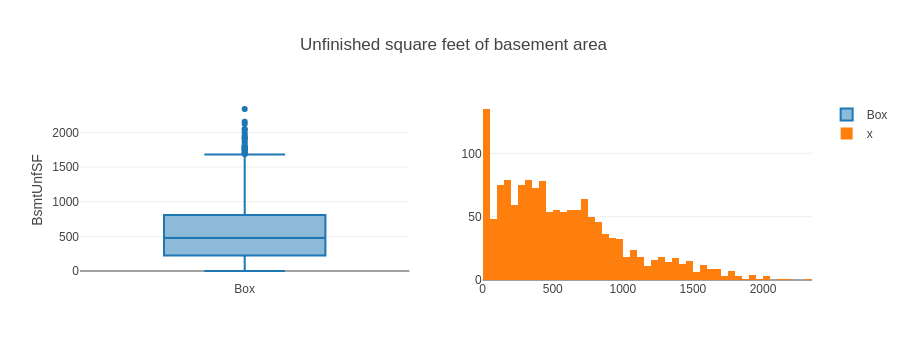

In [799]:
Numeric_plot(train, column='BsmtUnfSF', title='Unfinished square feet of basement area')#,ncols=3, trans_func='log1p')

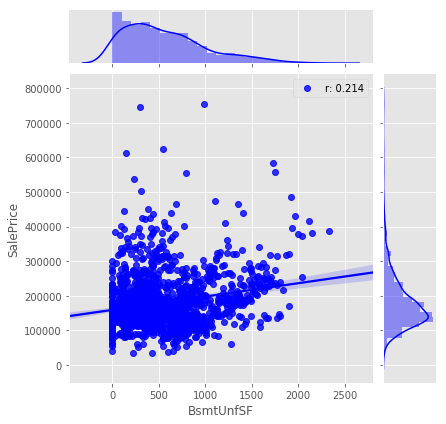

In [800]:
Regression_plot(train, column= 'BsmtUnfSF')

In [801]:
# Add to list of numeric column list
numeric_col.append('BsmtUnfSF')

### 2.40 TotalBsmtSF: Total square feet of basement area

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



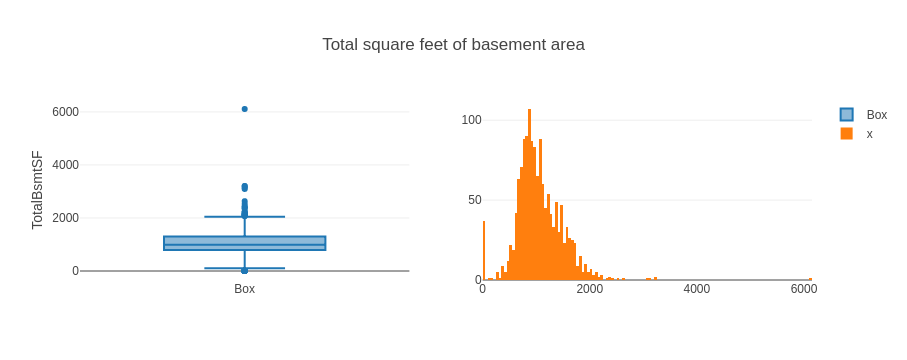

In [802]:
Numeric_plot(train, column='TotalBsmtSF', title='Total square feet of basement area')#,ncols=3, trans_func='log1p')

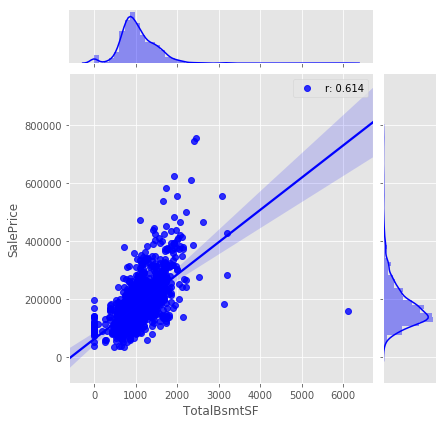

In [803]:
Regression_plot(train, column= 'TotalBsmtSF')

In [804]:
# Add to list of numeric column list
numeric_col.append('TotalBsmtSF')

### 2.41 Heating: Type of heating
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



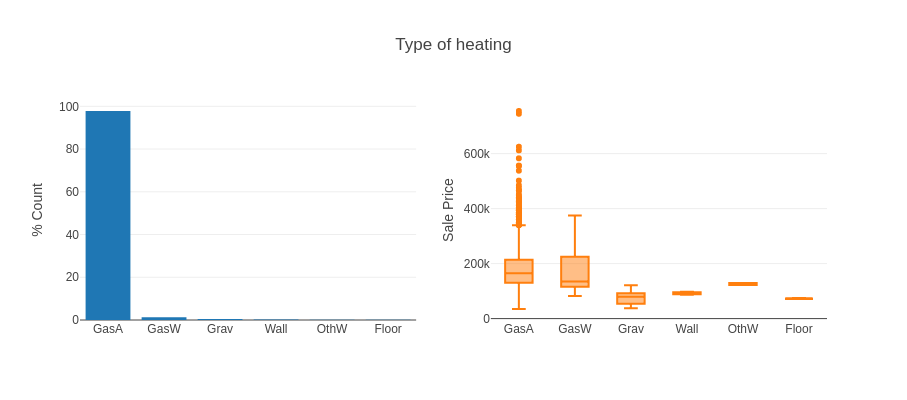

In [805]:
Categorical_plot(train, column='Heating', title= 'Type of heating',limit=None)

In [806]:
# Add to list of dro column list
drop_col.append('Heating')

### 2.42 HeatingQC: Heating quality and condition
* Ex: Excellent
* Gd: Good
* TA: Average/Typical
* Fa: Fair
* Po: Poor

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



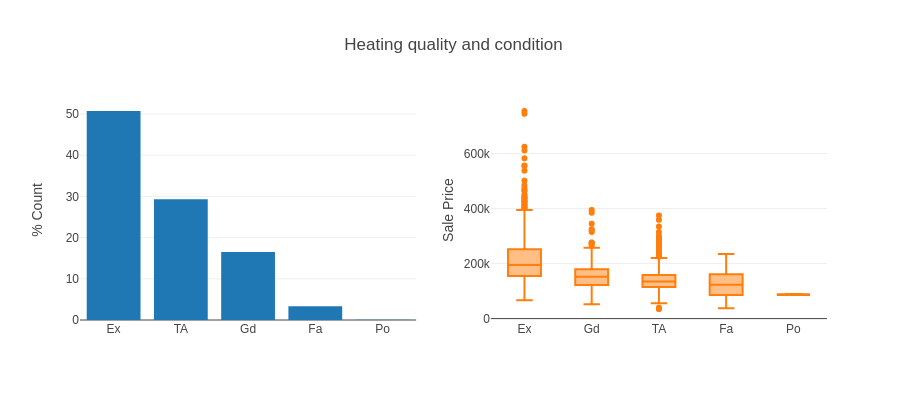

In [807]:
Categorical_plot(train, column='HeatingQC', title= 'Heating quality and condition',limit=None)

In [808]:
# Add to list of categorical column list
categorical_col.append('HeatingQC')

### 2.43 CentralAir: Central air conditioning

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



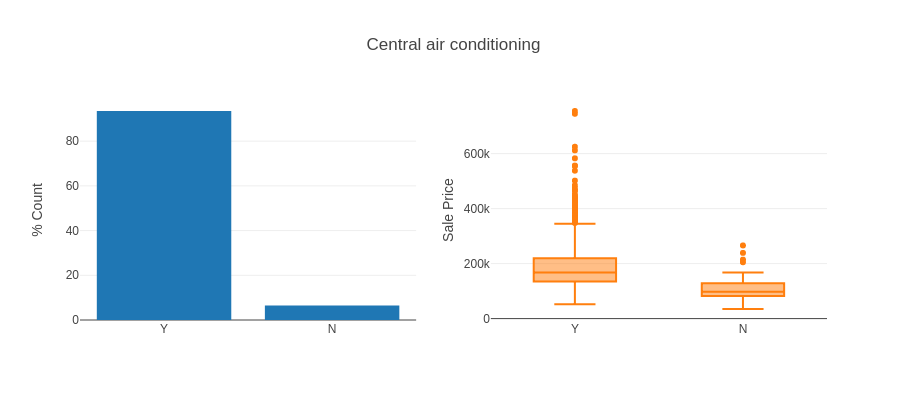

In [809]:
Categorical_plot(train, column='CentralAir', title= 'Central air conditioning',limit=None)

In [810]:
# Add to list of categorical column list
categorical_col.append('CentralAir')

### 2.44 Electrical: Electrical system
       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



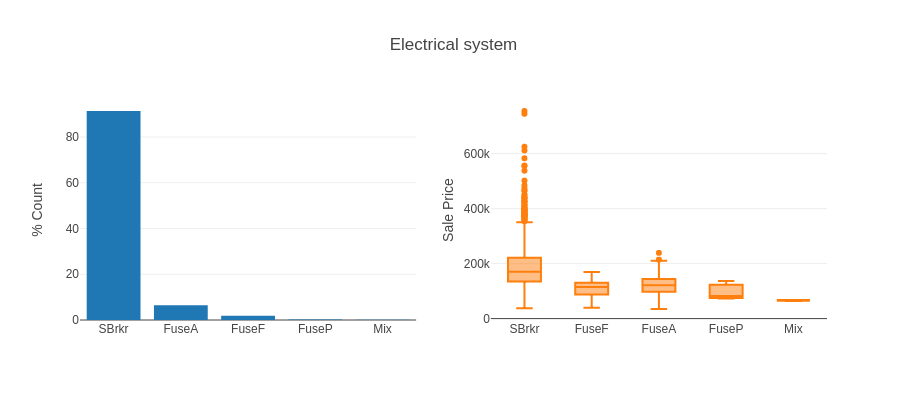

In [811]:
Categorical_plot(train, column='Electrical', title= 'Electrical system',limit=None)

In [812]:
# Add to list of categorical column list
categorical_col.append('Electrical')

### 2.44 
* 1stFlrSF: First Floor square feet 
* 2ndFlrSF: Second floor square feet
* LowQualFinSF: Low quality finished square feet (all floors)
* GrLivArea: Above grade (ground) living area square feet

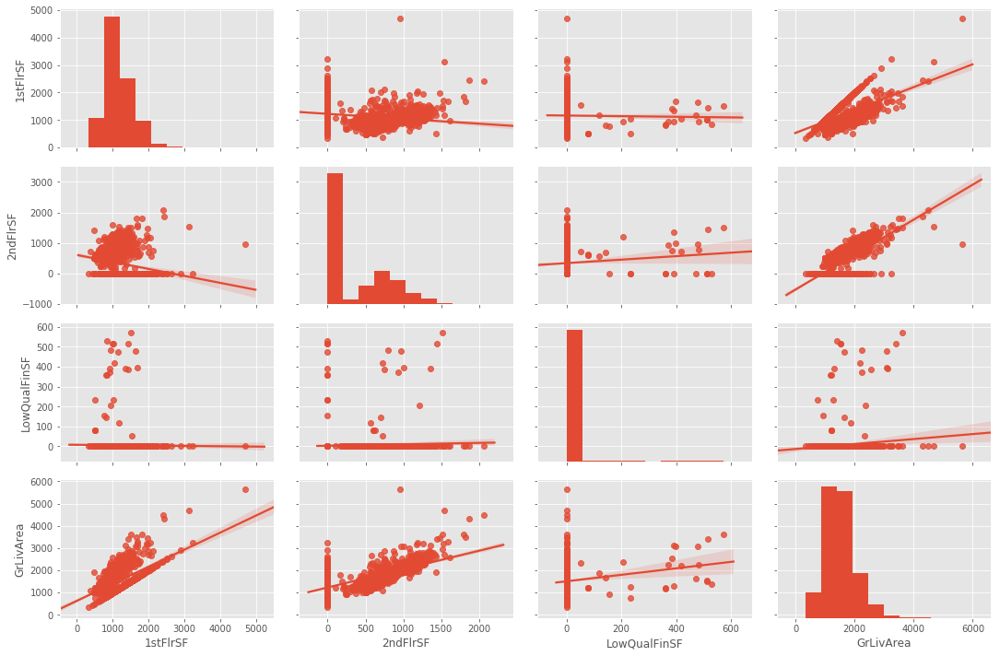

In [813]:
g = sns.pairplot(train, vars=['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea'],
                palette = 'viridis', kind= 'reg', aspect=1.5)

In [814]:
# Add to
numeric_col.extend(['1stFlrSF','2ndFlrSF','LowQualFinSF','GrLivArea'])

### 2.47 BsmtFullBath: Basement full bathrooms

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



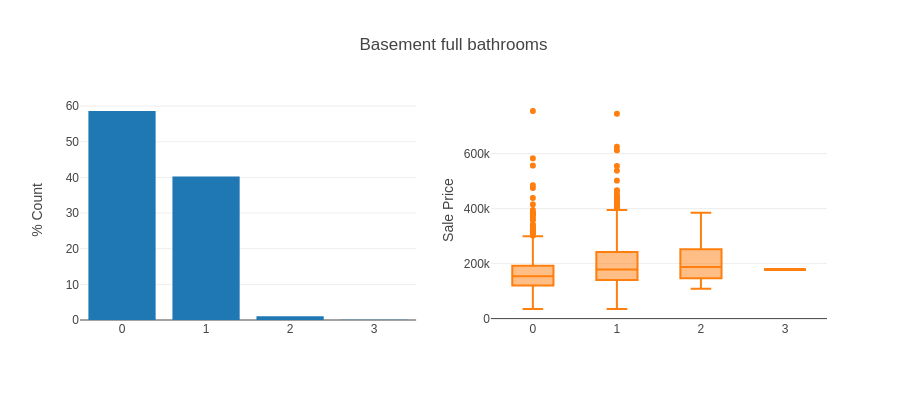

In [815]:
Categorical_plot(train, column='BsmtFullBath', title= 'Basement full bathrooms',limit=None)

In [816]:
# Add to list of categorical column list
categorical_col.append('BsmtFullBath')

### 2.48 BsmtHalfBath: Basement half bathrooms

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



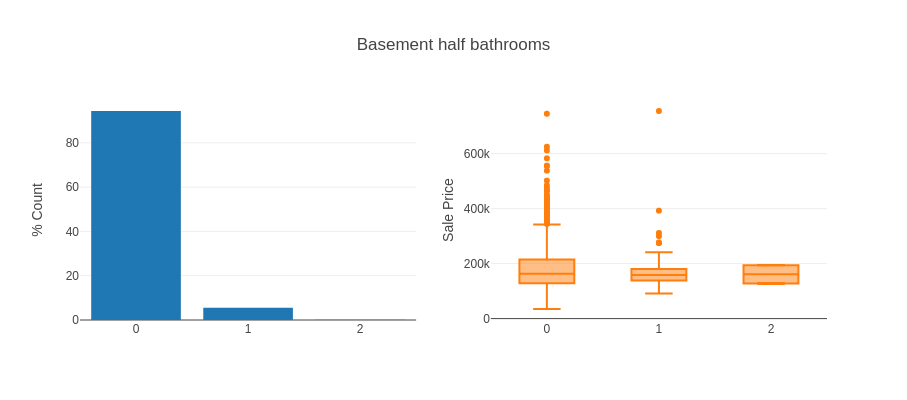

In [817]:
Categorical_plot(train, column='BsmtHalfBath', title= 'Basement half bathrooms',limit=None)

In [818]:
# Add to list of categorical column list
categorical_col.append('BsmtHalfBath')

### 2.49 FullBath: Full bathrooms above grade

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



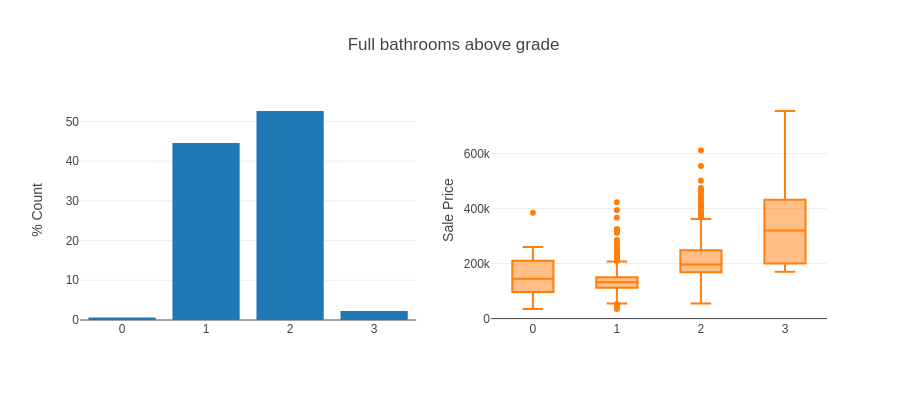

In [819]:
Categorical_plot(train, column='FullBath', title= ' Full bathrooms above grade',limit=None)

In [820]:
# Add to list of categorical column list
categorical_col.append('FullBath')

### 2.50 HalfBath: Half baths above grade

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



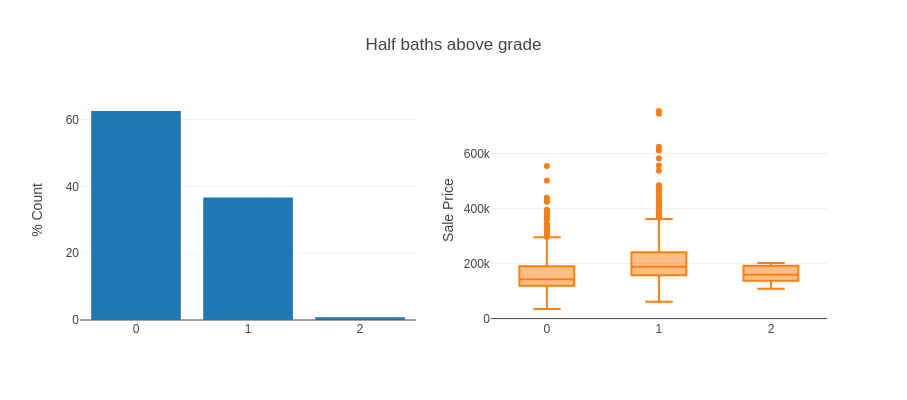

In [821]:
Categorical_plot(train, column='HalfBath', title= 'Half baths above grade',limit=None)

In [822]:
# Add to list of categorical column list
categorical_col.append('HalfBath')

### 2.51 Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



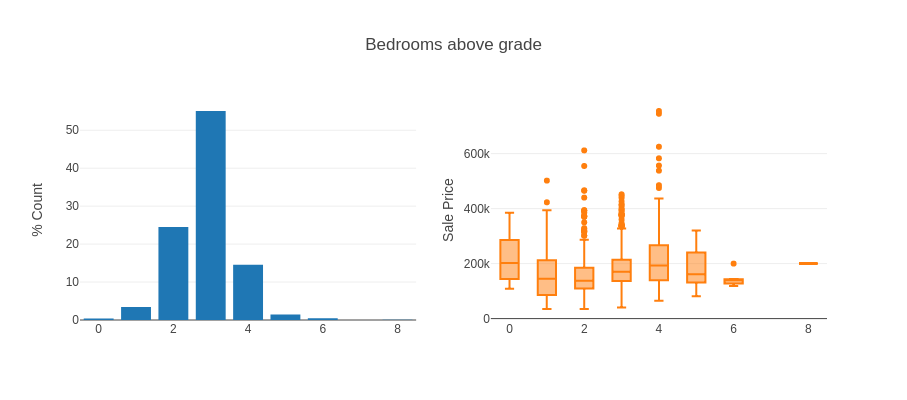

In [823]:
Categorical_plot(train, column='BedroomAbvGr', title= 'Bedrooms above grade',limit=None)

In [824]:
# Add to list of categorical column list
categorical_col.append('BedroomAbvGr')

### 2.52 KitchenAbvGr: Kitchens above grade

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



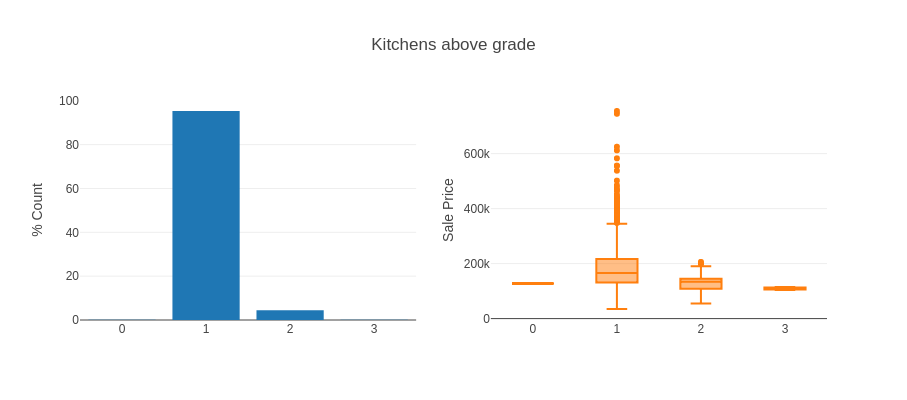

In [825]:
Categorical_plot(train, column='KitchenAbvGr', title= 'Kitchens above grade',limit=None)

In [826]:
# Add to list of categorical column list
categorical_col.append('KitchenAbvGr')

### 2.53 KitchenQual: Kitchen quality
* Ex: Excellent
* Gd: Good
* TA: Average/Typical
* Fa: Fair
* Po: Poor

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



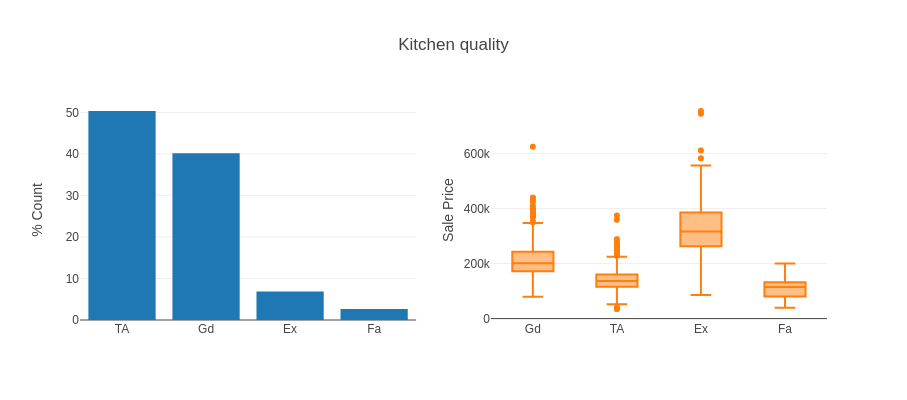

In [827]:
Categorical_plot(train, column='KitchenQual', title= 'Kitchen quality',limit=None)

In [828]:
# Add to list of categorical column list
categorical_col.append('KitchenQual')

### 2.54 TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



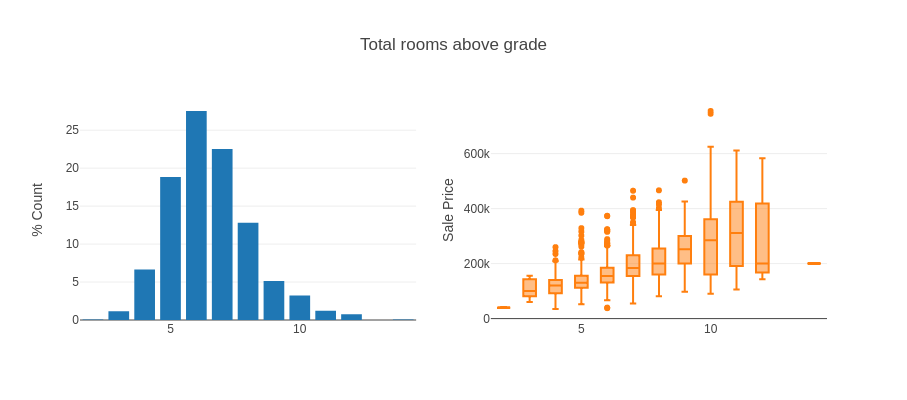

In [829]:
Categorical_plot(train, column='TotRmsAbvGrd', title= 'Total rooms above grade',limit=None)

In [830]:
# Add to list of categorical column list
categorical_col.append('KitchenQual')

### 2.55 Functional: Home functionality (Assume typical unless deductions are warranted)
       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



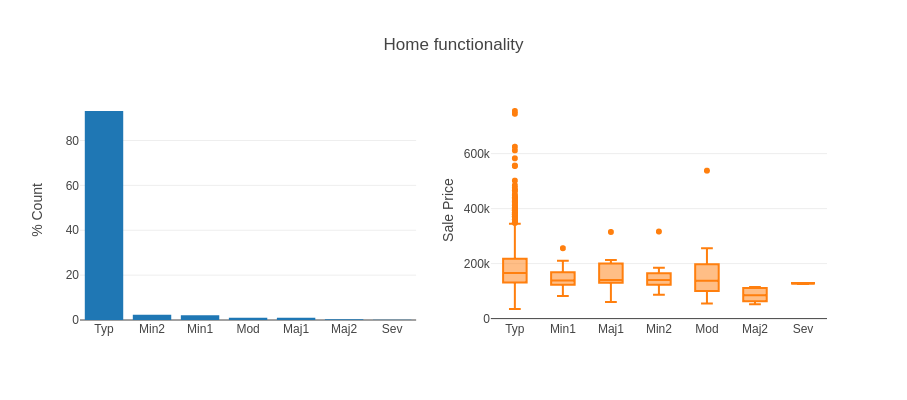

In [831]:
Categorical_plot(train, column='Functional', title= 'Home functionality',limit=None)

In [832]:
# Add to list of categorical column list
categorical_col.append('Functional')

### 2.56 Fireplaces: Number of fireplaces

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



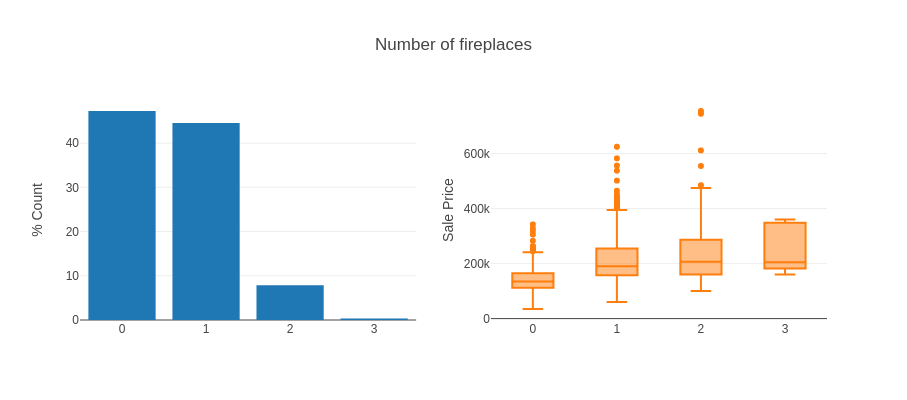

In [833]:
Categorical_plot(train, column='Fireplaces', title= 'Number of fireplaces',limit=None)

In [834]:
# Add to list of categorical column list
categorical_col.append('Fireplaces')

### 2.57 FireplaceQu: Fireplace quality
       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



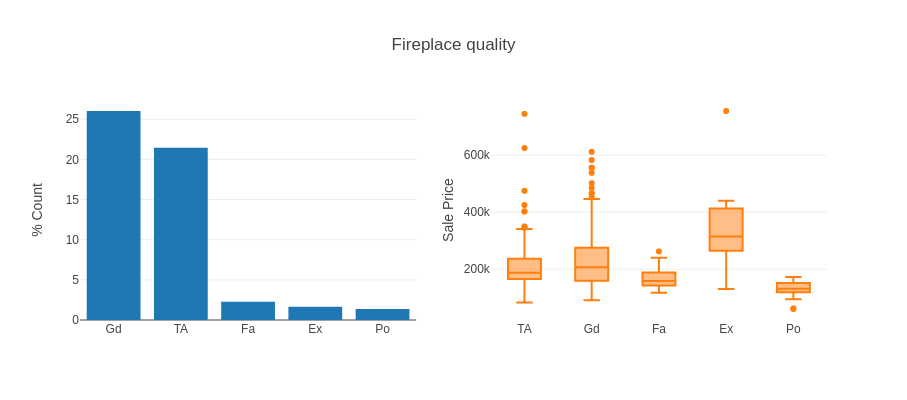

In [835]:
Categorical_plot(train, column='FireplaceQu', title= 'Fireplace quality',limit=None)

In [836]:
# Add to list of categorical column list
categorical_col.append('FireplaceQu')

### 2.57 GarageType: Garage location
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



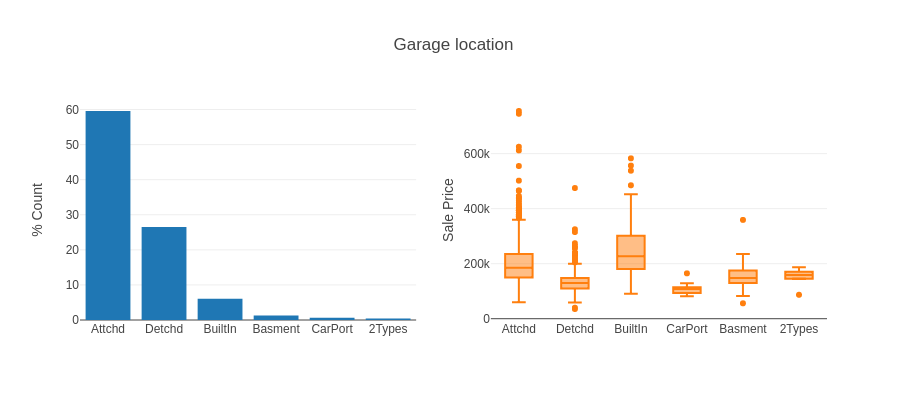

In [837]:
Categorical_plot(train, column='GarageType', title= 'Garage location',limit=None)

In [838]:
# Add to list of categorical column list
categorical_col.append('GarageType')

### 2.58 GarageYrBlt: Year garage was built

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



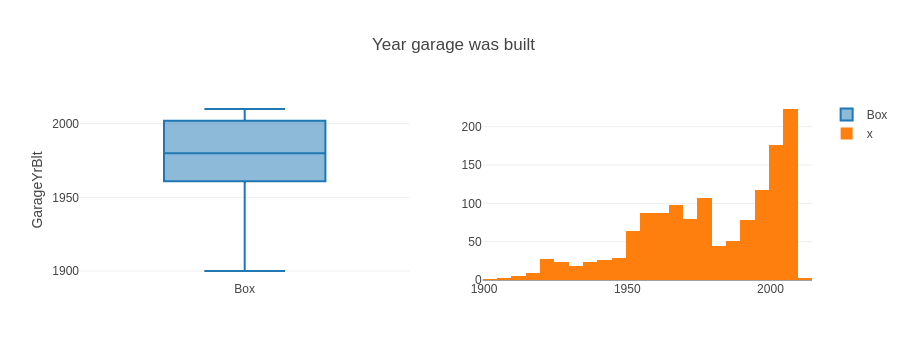

In [839]:
Numeric_plot(train, column='GarageYrBlt', title= 'Year garage was built')

In [840]:
# Add to list of Numeric column list
numeric_col.append('GarageYrBlt')

### 2.59 GarageFinish: Interior finish of the garage
       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



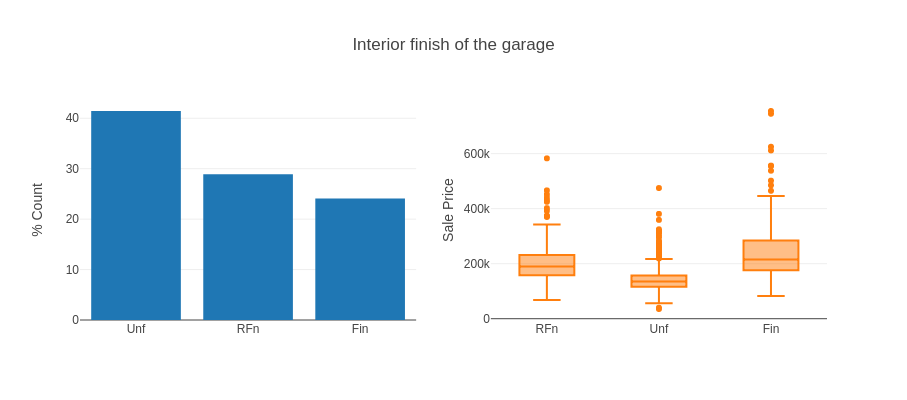

In [841]:
Categorical_plot(train, column='GarageFinish', title= 'Interior finish of the garage')

In [842]:
# Add to list of calegtory column list
categorical_col.append('GarageFinish')

### 2.60 GarageCars: Size of garage in car capacity

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



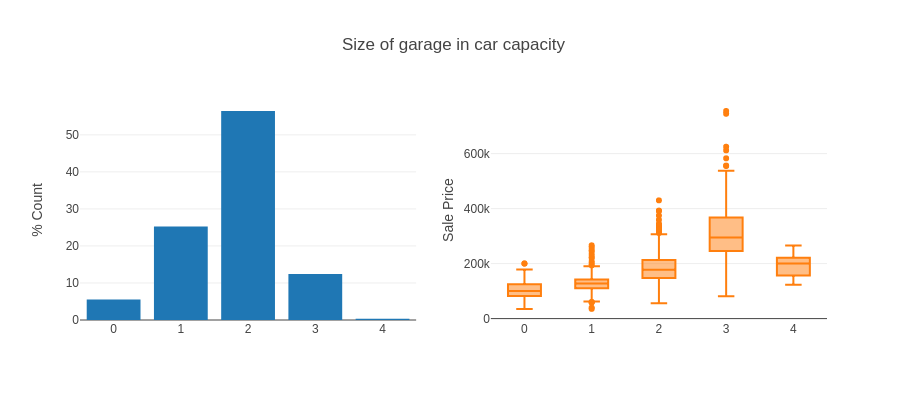

In [843]:
Categorical_plot(train, column='GarageCars', title= 'Size of garage in car capacity')

In [844]:
# Add to list of calegtory column list
categorical_col.append('GarageCars')

### 2.61 GarageArea: Size of garage in square feet

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



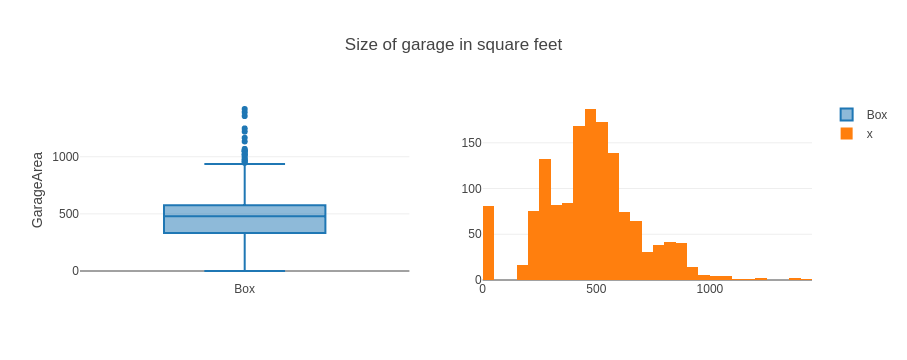

In [845]:
Numeric_plot(train, column='GarageArea', title= 'Size of garage in square feet')

In [846]:
# Add to list of numeric column list
numeric_col.append('GarageArea')

### 2.62 GarageQual: Garage quality
       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



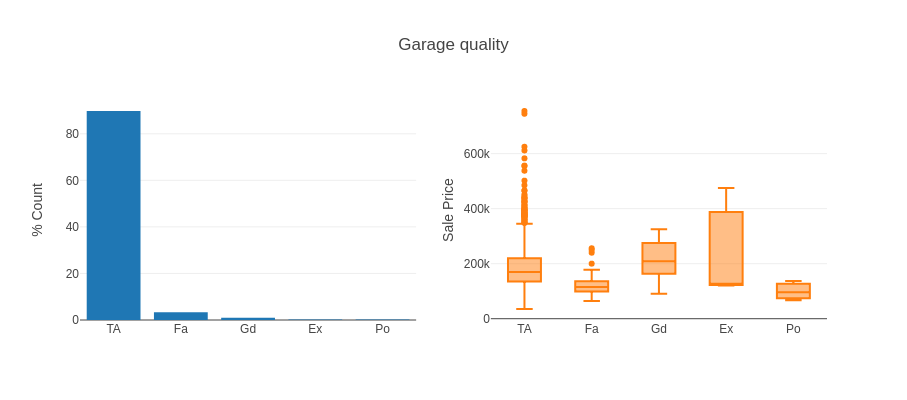

In [847]:
Categorical_plot(train, column='GarageQual', title= 'Garage quality')

In [848]:
# Add to list of calegtory column list
categorical_col.append('GarageQual')

### 2.63 GarageCond: Garage condition
       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



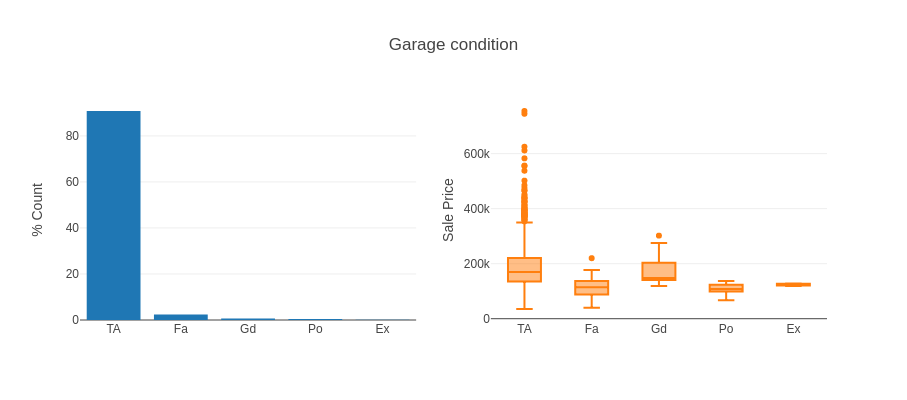

In [849]:
Categorical_plot(train, column='GarageCond', title= 'Garage condition')

In [850]:
# Add to list of calegtory column list
categorical_col.append('GarageCond')

### 2.64 PavedDrive: Paved driveway
       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



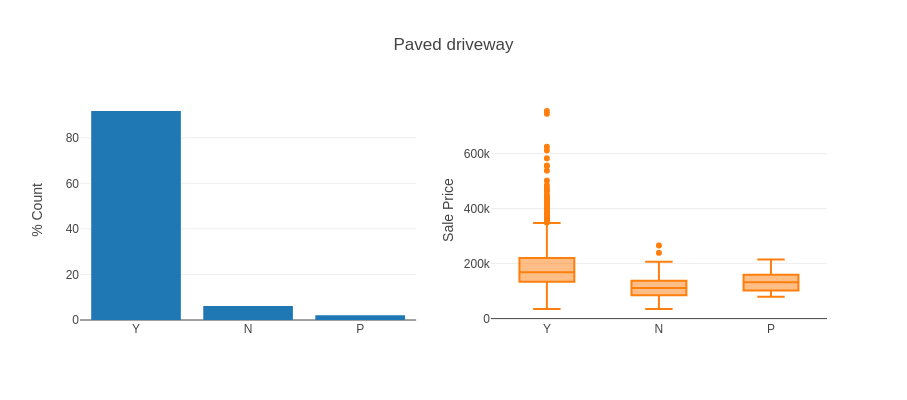

In [851]:
Categorical_plot(train, column='PavedDrive', title= 'Paved driveway')

In [852]:
# Add to list of calegtory column list
categorical_col.append('PavedDrive')

### 2.65 
* WoodDeckSF: Wood deck area in square feet
* OpenPorchSF: Open porch area in square feet
* EnclosedPorch: Enclosed porch area in square feet
* 3SsnPorch: Three season porch area in square feet
* ScreenPorch: Screen porch area in square feet
* PoolArea: Pool area in square feet

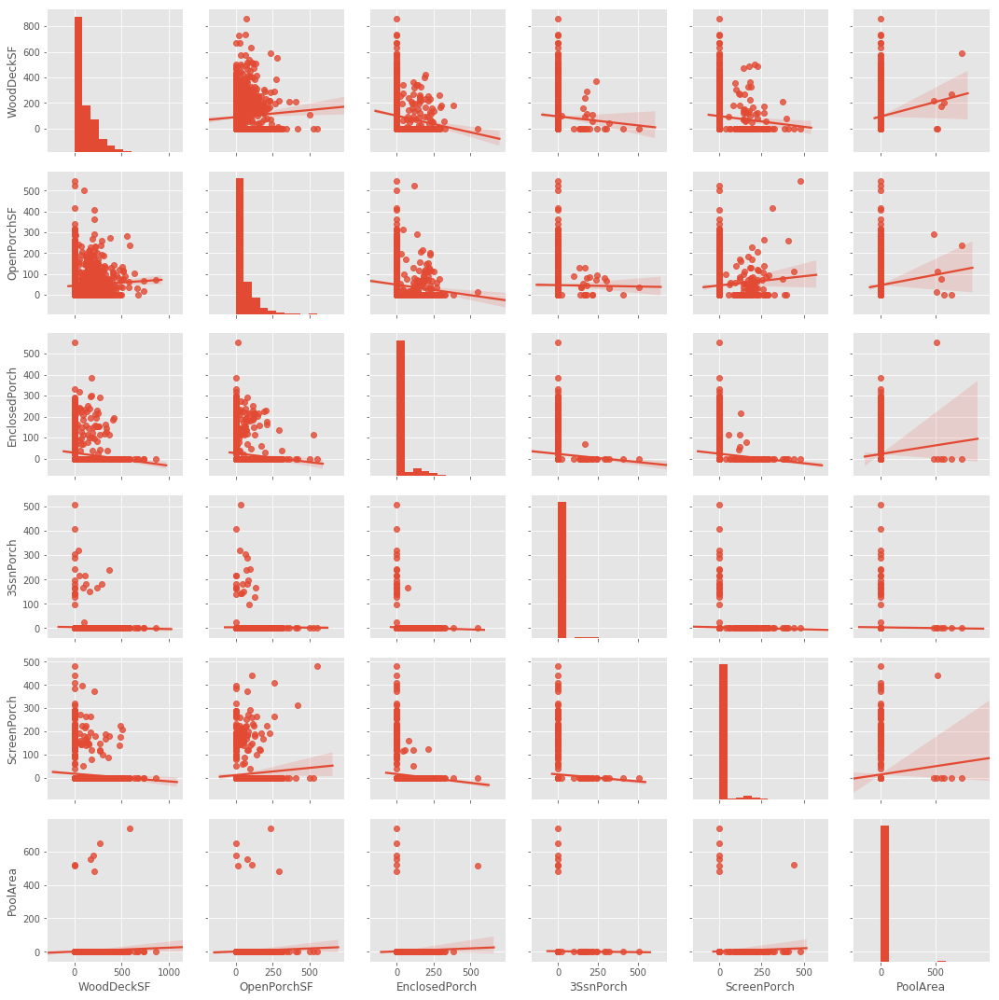

In [853]:
g = sns.pairplot(data= train, kind= 'reg',
                 vars= ['WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea'],)

In [854]:
# Add to
numeric_col.extend(['WoodDeckSF','OpenPorchSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea'])

### 2.66 PoolQC: Pool quality
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



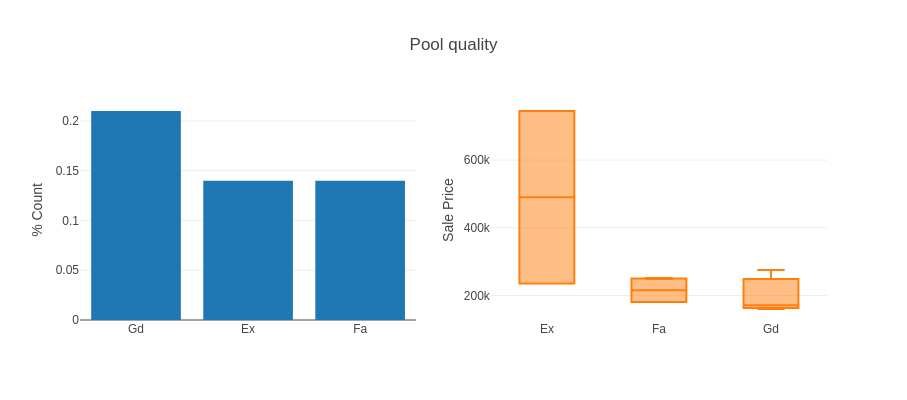

In [855]:
Categorical_plot(train, column='PoolQC', title= 'Pool quality')

In [856]:
# Add to list of calegtory column list
drop_col.append('PoolQC')

### 2.67 Fence: Fence quality
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



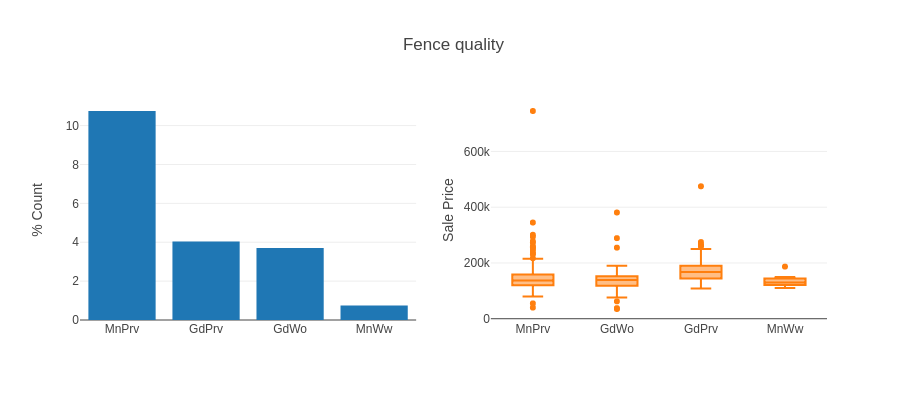

In [857]:
Categorical_plot(train, column='Fence', title= 'Fence quality')

In [858]:
# Add to list of calegtory column list
categorical_col.append('Fence')

### 2.67 MiscFeature: Miscellaneous feature not covered in other categories
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



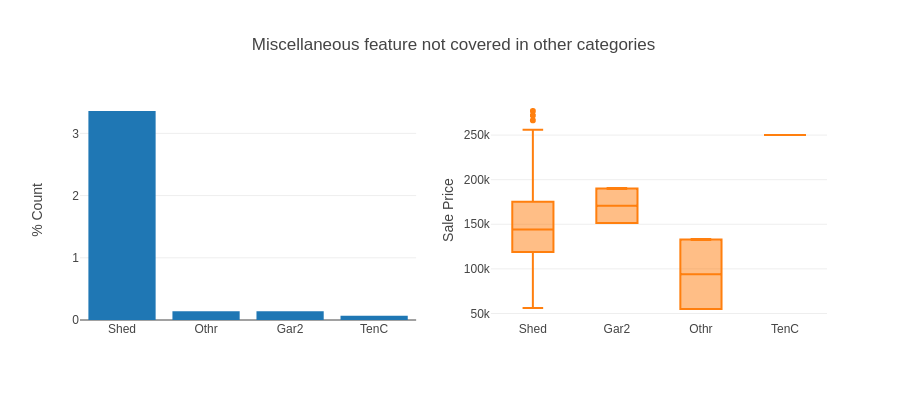

In [859]:
Categorical_plot(train, column='MiscFeature', title= 'Miscellaneous feature not covered in other categories')

In [860]:
# Add to list of drop column list
drop_col.append('MiscFeature')

### 2.68 MiscVal: $Value of miscellaneous feature

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



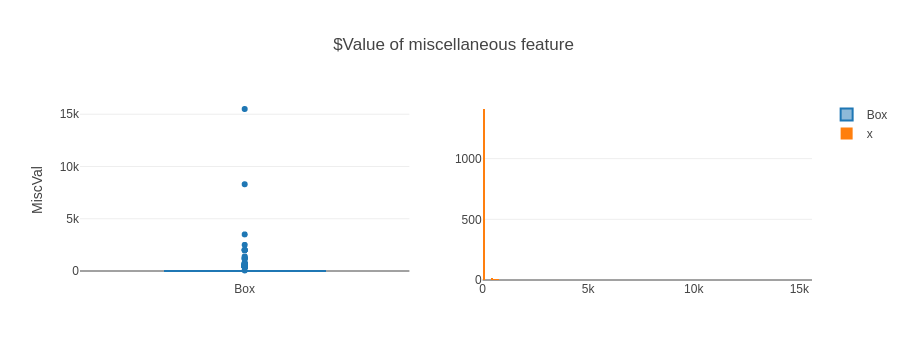

In [861]:
Numeric_plot(train, column='MiscVal', title='$Value of miscellaneous feature',)# ncols=3, trans_func='log1p')

In [862]:
# Add to numeric column list
numeric_col.append('MiscVal')

### 2.69 MoSold: Month Sold (MM)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



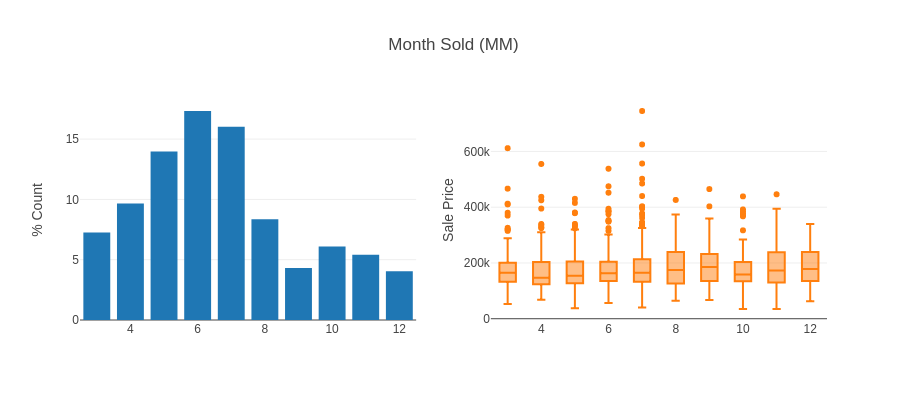

In [863]:
Categorical_plot(train, column='MoSold', title='Month Sold (MM)',)

In [864]:
# Add to categorical column list
categorical_col.append('MoSold')

### 2.70 YrSold: Year Sold (YYYY)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



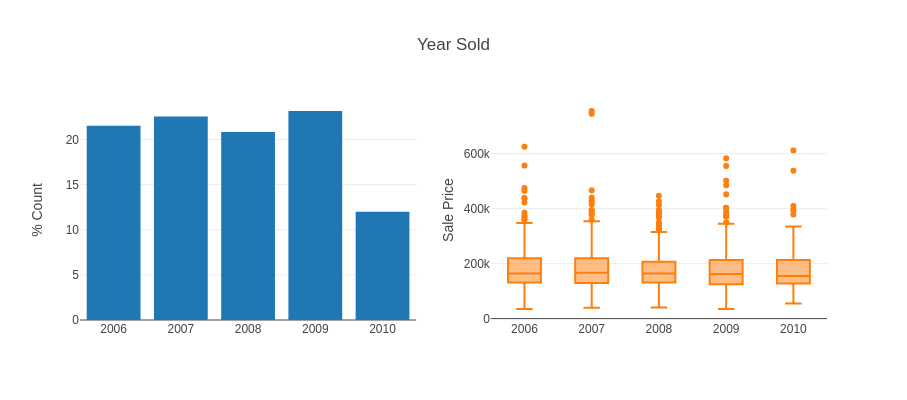

In [865]:
Categorical_plot(train, column='YrSold', title='Year Sold',)

In [866]:
# Add to categorical column list
categorical_col.append('YrSold')

### 2.71 SaleType: Type of sale
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



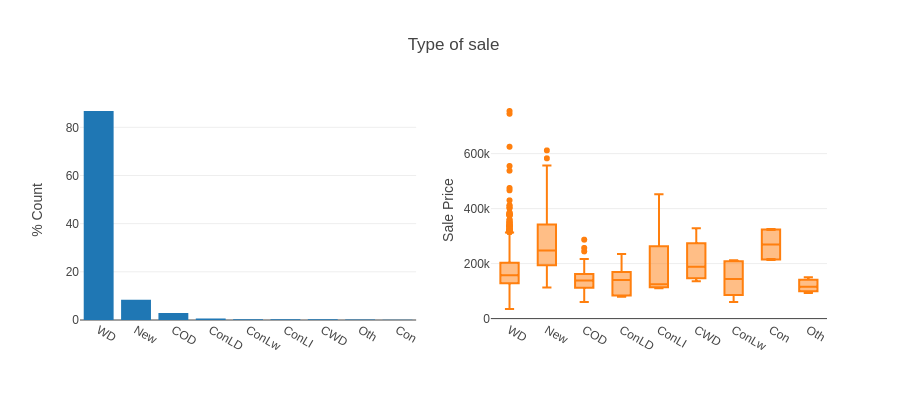

In [867]:
Categorical_plot(train, column='SaleType', title='Type of sale',)

In [868]:
# Add to categorical column list
categorical_col.append('SaleType')

### 2.72 SaleCondition: Condition of sale
       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



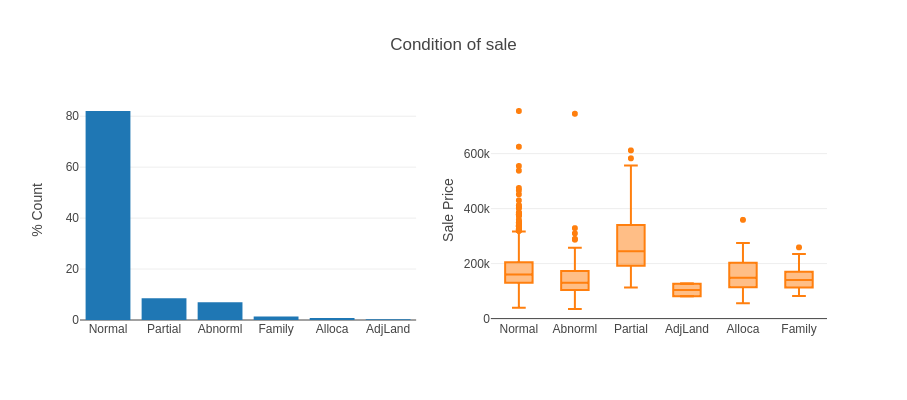

In [869]:
Categorical_plot(train, column='SaleCondition', title='Condition of sale',)

In [870]:
# Add to categorical column list
categorical_col.append('SaleCondition')

In [910]:
# Check column 
print('Check number of column',train.shape, len(categorical_col)+len(drop_col)+len(numeric_col))
train = train.drop(drop_col, axis=1)
test = test.drop(drop_col, axis=1)

(1460, 81) 79


### 3.0 Data preprocessing

In [911]:
def binary_encoding(df,columns):
    """Binary encoding"""
    print('*'*5,'Binary encoding','*'*5)
    lb = LabelBinarizer()
    print('Original shape:',df.shape)
    original_col = df.columns
    #columns = [i for i in columns if df[columns].nunique()>2]
    for i in columns:
        if df[i].nunique() >2:
            result = lb.fit_transform(df[i].fillna(df[i].mode()[0],axis=0))
            col = ['BIN_'+ str(i)+'_'+str(c) for c in lb.classes_]
            result1 = pd.DataFrame(result, columns=col)
            df = df.join(result1)
    print('After:',df.shape)
    new_col = [c for c in df.columns if c not in original_col]
    return df, new_col

In [912]:
def OneHotEncoding(df1, df2, columns, nan_as_category=True, drop_first=True):
    """One Hot Encoding: of categorical variable"""
    print(10*'*'+'One Hot Encoding:',df1.shape, df2.shape,10*'*')
    lenght = df1.shape[0]
    # Concatenate dataframe
    df = pd.concat([df1,df2], axis=0)
    
    # OHE
    df = pd.get_dummies(data = df, columns= columns, drop_first=drop_first, 
                        dummy_na=nan_as_category)
    
    df1 = df[:lenght]
    df2 = df[lenght:]
    print(10*'*','After One Hot Encoding:',df1.shape, df2.shape,10*'*')
    return df1, df2

In [913]:
train1, test1 = OneHotEncoding(train, test, columns=categorical_col)

**********One Hot Encoding: (1460, 76) (1459, 75) **********
********** After One Hot Encoding: (1460, 351) (1459, 351) **********


In [914]:
def Fill_missing_value(df,column):
    """Fill missing value with Mean"""
    for c in column:
        if df[c].isnull().sum() >0:
            df[c] = df[c].fillna(df[c].mean())
    print('Check Missing value:',df.isnull().sum().sum())
    return df

In [915]:
train1 = Fill_missing_value(train1,numeric_col)
test1 = Fill_missing_value(test1,numeric_col)

Check Missing value: 0
Check Missing value: 1459


In [916]:
def Descriptive_stat_feat(df,columns):
    """ Descriptive statistics feature
    genarating function: Mean,Median,Q1,Q3"""
    print('*'*5,'Descriptive statistics feature','*'*5)
    print('Before',df.shape)
    mean = df[columns].mean()
    median = df[columns].median()
    Q1 = np.percentile(df[columns], 25, axis=0)
    Q3 = np.percentile(df[columns], 75, axis=0)
    for i,j in enumerate(columns):
        df['mean_'+j] = (df[j] < mean[i]).astype('int8')
        df['median_'+j] = (df[j] > median[i]).astype('int8')
        df['Q1'+j] = (df[j] < Q1[i]).astype('int8')
        df['Q3'+j] = (df[j] > Q3[i]).astype('int8')
    print('After ',df.shape)
    return df

In [917]:
train1 = Descriptive_stat_feat(train1, columns = numeric_col)
test1 = Descriptive_stat_feat(test1, columns = numeric_col)

***** Descriptive statistics feature *****
Before (1460, 351)
After  (1460, 439)
***** Descriptive statistics feature *****
Before (1459, 351)
After  (1459, 439)


## 4.0 Model Selection

In [944]:
test_id = test1['Id']
X = train1.drop(['Id','SalePrice'], axis=1)
y = np.log1p(train1['SalePrice'])
new_test = test1.drop(['Id','SalePrice'], axis=1)
#X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.25, random_state=seed)

In [981]:
np.linspace(0,1,20)

array([0.        , 0.05263158, 0.10526316, 0.15789474, 0.21052632,
       0.26315789, 0.31578947, 0.36842105, 0.42105263, 0.47368421,
       0.52631579, 0.57894737, 0.63157895, 0.68421053, 0.73684211,
       0.78947368, 0.84210526, 0.89473684, 0.94736842, 1.        ])

In [1009]:
from sklearn.model_selection import RandomizedSearchCV
reg = Ridge(alpha= 1.0)
rsCV = RandomizedSearchCV(reg,cv= 5,param_distributions={'alpha':np.linspace(0,20,100)},random_state= seed)
rsCV.fit(X,y)

RandomizedSearchCV(cv=5, error_score='raise-deprecating',
          estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001),
          fit_params=None, iid='warn', n_iter=10, n_jobs=None,
          param_distributions={'alpha': array([ 0.     ,  0.20202, ..., 19.79798, 20.     ])},
          pre_dispatch='2*n_jobs', random_state=4432, refit=True,
          return_train_score='warn', scoring=None, verbose=0)

In [1012]:
rsCV.best_params_

{'alpha': 8.686868686868687}

### 5.0 Model
Let's build L2 regularized linear regression with 5 fold cross validation strategy.

In [1013]:
kf = KFold(n_splits=5, random_state=seed,)

final_pred = 0
rmse = []
r_square = []
for i, (train_index, test_index) in enumerate(kf.split(X)):
    print(f'Modelling {i+1} of {kf.n_splits} fold')
    X_train, X_valid = X.loc[train_index], X.loc[test_index]
    y_train, y_valid = y[train_index], y[test_index]
    
    # L2 - Regression
    reg = Ridge(alpha = rsCV.best_params_['alpha'])
    reg.fit(X_train, y_train)
    y_pred = reg.predict(X_valid)
    final_pred += reg.predict(new_test)
    r2 = reg.score(X_valid, y_valid)
    r_square.append(r2)
    print('*'*10,'R sqaure:',round(r2,3), '*'*10,'\n')
    rmse.append(mean_squared_error(y_valid, y_pred)**0.5)

Modelling 1 of 5 fold
********** R sqaure: 0.901 ********** 

Modelling 2 of 5 fold
********** R sqaure: 0.873 ********** 

Modelling 3 of 5 fold
********** R sqaure: 0.899 ********** 

Modelling 4 of 5 fold
********** R sqaure: 0.894 ********** 

Modelling 5 of 5 fold
********** R sqaure: 0.803 ********** 



## 6.0 Model Evaluation

In [1014]:
print(rmse,'\nRMSE:',np.mean(rmse))

[0.12134689359388232, 0.15168690361073656, 0.12989375043904472, 0.12393037064507516, 0.17357997884699805] 
RMSE: 0.14008757942714736


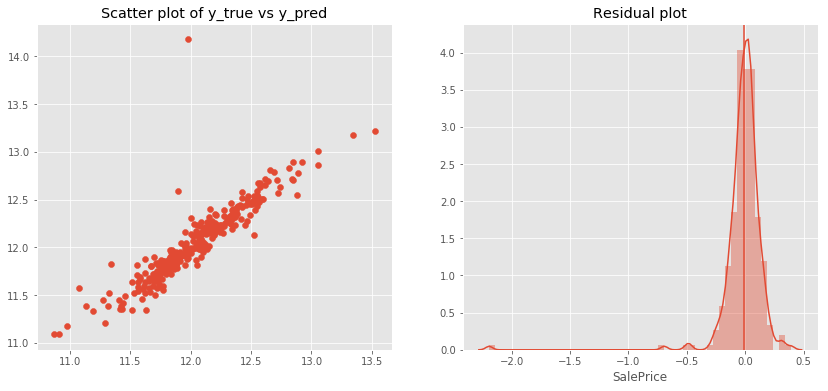

In [1017]:
f = plt.figure(figsize= (14,6))

ax = f.add_subplot(121)
ax.scatter(y_valid, y_pred)
plt.title('Scatter plot of y_true vs y_pred')

residual = y_valid - y_pred
ax = f.add_subplot(122)
sns.distplot(residual, ax = ax)
plt.axvline(residual.mean())
plt.title('Residual plot');

In [991]:
#pred = reg.predict(new_test)
pred = np.expm1(final_pred/ kf.n_splits)
submit = pd.DataFrame({'Id':test_id,'SalePrice':pred})
submit.to_csv('houseprice.csv',index= False)
print('Shape: ',submit.shape)
submit.head()

Shape:  (1459, 2)


,Id,SalePrice
0,1461,126972.476106
1,1462,161363.561411
2,1463,192707.914287
3,1464,203701.346972
4,1465,193024.302808


### Thank you